<a href="https://colab.research.google.com/github/ZohebAbai/mobile_sensing_robotics/blob/main/Graph_based_SLAM.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Exercise 2 : Graph-based SLAM

The goal of this assignment is to implement a least-squares based method to address the SLAM problem in its graph-based formulation as explained in the lecture. 

We will consider 2D poses $(x, y, \theta)$ of the robot and 2D landmarks $(x_l, y_l)$ as the unknowns in our SLAM problem. The data is provided as a graph structure containing nodes (poses and landmarks) and constraints between these nodes (i.e pose-pose and pose-landmark). These datasets are stored as `dataset.g2o` text files. You are provided with the following datasets (see `data` folder), each of which represents the measurements of one SLAM problem.
1. `simulation-pose-pose.g2o`: simulated measurements containing pose-pose constraints only  
2. `simulation-pose-landmark.g2o`: simulated measurements containing both pose-pose and pose-landmark constraints
3. `intel.g2o`: real world measurements containing pose-pose constraints only
4. `dlr.g2o`: real world measurements containing both pose-pose and pose-landmark constraints

To get started with this task, we provide some Python code which will help in loading the graph structure, visualize it and other functions that you may need. We also provide additional notes `graph-slam-notes.pdf` which explains the Jacobian computations in detail.

## Task 2.0 Understanding the graph structure

Each graph consists of a set of nodes (or vertices) and edges that connect these nodes. As discussed in the lecture, the nodes correspond to the unknowns of the least-squares SLAM, whereas the edges correspond to the constraints obtained from the measurements.  In this assignment, the graph has the following types of nodes and edges:

1. Nodes:

    `VERTEX_SE2`: These nodes represent the 2D pose of the robot $(x, y, \theta)$

    `VERTEX_XY`: These nodes represent the 2D location of the landmark $(x_l, y_l)$
    
2. Edges:

    `EDGE_SE2`: These edges represent a constraint between two VERTEX_SE2 nodes. We refer to these edges as pose-pose constraints.
    
    `EDGE_SE2_XY`: These edges represent a constraint between a VERTEX_SE2 node and a VERTEX_XY node. We refer these edges as pose-landmark edge. 
    

In our code, we represent the graph as a class with the following attributes:
1. `nodes`: A dictionary of nodes where the information of each `node` can be accessed with `nodeId` as a key. Each `node` has a unique `nodeId`. This node can be either `VERTEX_SE2` or `VERTEX_XY`. If node has a dimension of 3, it represents the pose the robot (`VERTEX_SE2`). If the node has a dimension of 2, it represents the location of landmark (`VERTEX_XY`).
  
    
2. `edges`: A list of all the `edges` in the graph where each `edge` has the following attributes:

`Type`: The type is 'P' if the constraint is a pose-pose constraint (`EDGE_SE2`), whereas it is 'L' of it is a pose-landmark constraint (`EDGE_SE2_XY`).
`fromNode`: `nodeId` of the node from which the edge originates from.
`toNode`: `nodeId` of the node to which the edge terminates to.
`measurement`: The measurement corresponding to the edge.
`information`: The corresponding information matrix for the edge constraint.
    
3. `x`: All the unknowns (node variables) are stacked into a vector. This should be used for updating the state after each iteration of the optimization.

4. `lut`: This is a lookup table (implemented as a dictionary in Python). `lut[nodeId]` provides the starting location of the variables of the node with id `nodeId`.

Go through the examples in the cell below to understand how to work with the graph structure. Ensure that you understand how the graph is organized. This will be neccessary to solve all the tasks in the assignment. 

Loaded graph with 77 nodes and 297 edges


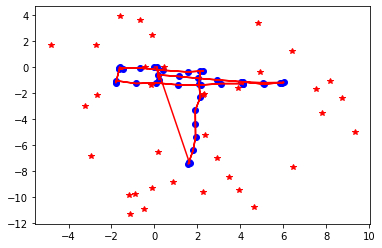

Loaded graph with 77 nodes and 297 edges
Node 128 = [ 0.378644 -0.23988  -0.0333  ] is a VERTEX_SE2 node
Node 128 from the state vector = [ 0.378644 -0.23988  -0.0333  ]
Node 1 = [ 8.76682 -2.35679] is a VERTEX_XY node
Node 1 from the state vector = [ 8.76682 -2.35679]
Edge 0 = Edge(Type='P', fromNode=100, toNode=101, measurement=array([ 0.112639,  0.023666, -1.57066 ], dtype=float32), information=array([[ 100.,    0.,    0.],
       [   0.,  100.,    0.],
       [   0.,    0., 1000.]], dtype=float32)) is a pose-pose constraint
Edge 1 = Edge(Type='L', fromNode=101, toNode=4, measurement=array([0.050648, 0.357701], dtype=float32), information=array([[100.,   0.],
       [  0., 100.]], dtype=float32)) is a pose-landmark constraint


In [1]:
import ex5
import matplotlib.pyplot as plt
%matplotlib inline

# load a dataset 
filename = 'simulation-pose-landmark.g2o'
graph = ex5.read_graph_g2o(filename)

# visualize the dataset
ex5.plot_graph(graph)
print('Loaded graph with {} nodes and {} edges'.format(len(graph.nodes), len(graph.edges)))

# print information for the two types of nodes
nodeId = 128
print('Node {} = {} is a VERTEX_SE2 node'.format(nodeId, graph.nodes[nodeId]))

# access the state vector using the lookup table
fromIdx = graph.lut[nodeId]
print('Node {} from the state vector = {}'.format(nodeId,graph.x[fromIdx:fromIdx+3]))

nodeId = 1
print('Node {} = {} is a VERTEX_XY node'.format(nodeId, graph.nodes[nodeId]))

# access the state vector using the lookup table
fromIdx = graph.lut[nodeId]
print('Node {} from the state vector = {}'.format(nodeId, graph.x[fromIdx:fromIdx+2]))

# print information for two types of edges
eid = 0 
print('Edge {} = {} is a pose-pose constraint'.format(eid, graph.edges[eid]))

eid = 1 
print('Edge {} = {} is a pose-landmark constraint'.format(eid, graph.edges[eid]))

## Task 1.2.1 Computing total error. [5]

In this task, you have implement the function  `compute_global_error` function  for computing the current error value for a graph with constraints. Compute this error for all the four datasets and print the results. 

In [2]:
# load a dataset 
filenames = ['simulation-pose-pose.g2o','simulation-pose-landmark.g2o','intel.g2o', 'dlr.g2o']
for filename in filenames:
    graph = ex5.read_graph_g2o(filename)

    # compute error
    err = ex5.compute_global_error(graph)
    print(filename," global error: ",err,"\n")

Loaded graph with 400 nodes and 1773 edges
simulation-pose-pose.g2o  global error:  3558.070922853723 

Loaded graph with 77 nodes and 297 edges
simulation-pose-landmark.g2o  global error:  916.8378583691616 

Loaded graph with 1728 nodes and 4830 edges
intel.g2o  global error:  6109.40490122823 

Loaded graph with 3873 nodes and 17605 edges
dlr.g2o  global error:  320181.8183451891 



## 1.2.2 Linearization of a Pose-Pose constraint [5]

Since the constraint described by the edge between two pose nodes is non-linear, you need to linearize it solve the least-squares optimization. The function `linearize_pose_pose_constraint` computes the error and the Jacobian for pose-pose constraint. It takes as input: 
   
    x1 : 3x1 vector 
         $(x,y,\theta)$ of the first robot pose
    x2 : 3x1 vector
         $(x,y,\theta)$ of the second robot pose
    z :  3x1 vector
         $(x,y,\theta)$ of the measurement
    
and returns

    e  : 3x1
         error of the constraint
    A  : 3x3
         Jacobian wrt x1
    B  : 3x3
         Jacobian wrt x2

Implement the `linearize_pose_pose_constraint` function and verify that it is correct. 

**Hint** : You can verify the Jacobian computation by comparing against a numerically Jacobian for your test data.


In [3]:
filename = 'simulation-pose-landmark.g2o'
g = ex5.read_graph_g2o(filename)

edge = g.edges[0]

# pose-pose constraint
if edge.Type == 'P':

    # compute idx for nodes using lookup table
    fromIdx = g.lut[edge.fromNode]
    toIdx = g.lut[edge.toNode]

    # get node state for the current edge
    x1 = g.x[fromIdx:fromIdx + 3]
    x2 = g.x[toIdx:toIdx + 3]

    # get measurement and information matrix for the edge
    z12 = edge.measurement

# compute error and jacobians
e, A, B = ex5.linearize_pose_pose_constraint(x1, x2, z12)
print(e)
print(A)
print(B)

Loaded graph with 77 nodes and 297 edges
[[0.]
 [0.]
 [0.]]
[[-1.36331713e-04  1.00000000e+00  1.12642229e-01]
 [-1.00000000e+00 -1.36331713e-04  2.36506437e-02]
 [ 0.00000000e+00  0.00000000e+00 -1.00000000e+00]]
[[ 1.36331713e-04 -1.00000000e+00  0.00000000e+00]
 [ 1.00000000e+00  1.36331713e-04  0.00000000e+00]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


## 1.2.3 Linearization of a Pose-Landmark constraint [5]

Since the constraint described by the edge between a pose and landmark node is non-linear, you need to linearize it solve the least-squares optimization. The function `linearize_pose_landmark_constraint` computes the error and the Jacobian for pose-landmark constraint. It takes as input: 

    x : 3x1 vector
        (x,y,theta) og the robot pose
    l : 2x1 vector
        (x,y) of the landmark
    z : 2x1 vector
        (x,y) of the measurement
    
and returns:

    e : 2x1 vector
        error for the constraint
    A : 2x3 Jacobian wrt x
    B : 2x2 Jacobian wrt l
    
Implement the `linearize_pose_landmark_constraint` function and verify that it is correct. 

**Hint** : You can verify the Jacobian computation by comparing against a numerically Jacobian for your test data.

In [4]:
filename = 'simulation-pose-landmark.g2o'
g = ex5.read_graph_g2o(filename)

edge = g.edges[1]

# pose-pose constraint
if edge.Type == 'L':

    # compute idx for nodes using lookup table
    fromIdx = g.lut[edge.fromNode]
    toIdx = g.lut[edge.toNode]

    # get node state for the current edge
    x = g.x[fromIdx:fromIdx + 3]
    l = g.x[toIdx:toIdx + 2]

    # get measurement and information matrix for the edge
    z = edge.measurement

# compute error and jacobians
e, A, B = ex5.linearize_pose_landmark_constraint(x, l, z)
print(e)
print(A)
print(B)

Loaded graph with 77 nodes and 297 edges
[[7.66575907e-07]
 [7.53587835e-08]]
[[-1.36331713e-04  1.00000000e+00  3.57701093e-01]
 [-1.00000000e+00 -1.36331713e-04 -5.06487675e-02]]
[[ 1.36331713e-04 -1.00000000e+00]
 [ 1.00000000e+00  1.36331713e-04]]


## 1.2.4 Building and Solving Linearized System [5]

The `linearize_and_solve` function builds the $H$ and $b$ matrices in order to solve for $dx$ (i.e. change in the unknowns $x$) for one iteration. The function takes as input:

    g : graph at iteration i
    
and returns

    dx : Nx1 vector 
        change in the solution for the unknowns x

Implement the `linearize_and_solve` function. Some skeletal code for the function is already provided to you to start with.

In [5]:
filename = 'simulation-pose-landmark.g2o'
g = ex5.read_graph_g2o(filename)
dx = ex5.linearize_and_solve(g)
print(f"for first iteration\n {dx}")

Loaded graph with 77 nodes and 297 edges
linearize and build system
for first iteration
 [ 4.36748331e-01  8.03554105e-01 -2.58151423e-02  3.47002557e-02
  2.30244904e+00 -2.30500961e-01 -2.27405767e-02  1.95655637e-01
  1.71116807e+00  7.26801212e-01 -1.10397509e-01  2.07378113e-01
  2.01316785e+00 -4.89734903e-01  2.55689103e-02  1.95381362e-01
  4.94805008e-01  9.13912311e-01  7.62950211e-01 -1.00211030e-01
  2.53566761e+00 -3.66421882e-01 -1.98767903e-01  8.33588500e-02
 -7.83103065e-03 -7.40075400e-02 -6.24607840e-02  3.47307700e-01
  2.35748860e+00  1.38994844e+00  3.22812156e-01  2.82556833e-01
  1.26317215e+00  4.52282320e-01 -3.59534690e-01  7.05799323e-02
  5.74143951e-01  2.78052998e-01  1.40428125e-02  5.81892339e-03
  6.05547818e-01  2.83280967e-01 -3.48968970e-02 -3.64902029e-01
  9.87706324e-01 -1.13865948e-01  1.24432587e+00 -9.04048717e-01
  4.66347870e-01  6.71496136e-01  1.87322918e+00  9.79004515e-01
  9.84746738e-02  2.65441090e-01  4.17291533e-01 -2.01947569e-01
 

## 1.2.5 Iterative procedure for solving non-linear least squares [5]

The `run_graph_slam` function iteratively solves the least squares problem and updates the unknowns $x$. The procedure should be terminated if the change in $|dx| < 10^-4$ or the until a maximum number of iterations  (maxIter = 100) is reached. 

Implement the function `run_graph_slam` to perform the optimization. Some hints are provided as comments in the function. Test the function on the `simulation-pose-pose.g2o` and `simulation-pose-landmark.g2o` datasets. 

### Simulated datasets

Loaded graph with 77 nodes and 297 edges
linearize and build system


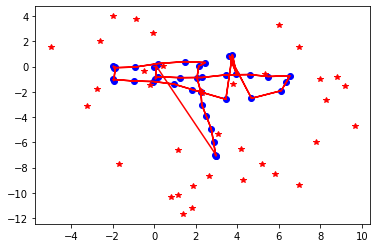

|dX| for step 0 : 9.822053710903539

linearize and build system


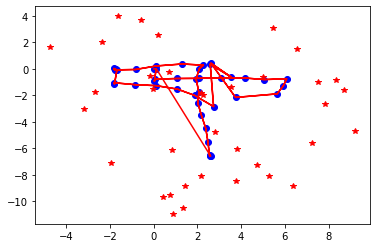

|dX| for step 1 : 4.413702589378809

linearize and build system


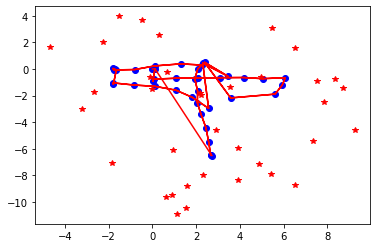

|dX| for step 2 : 1.043363651893091

linearize and build system


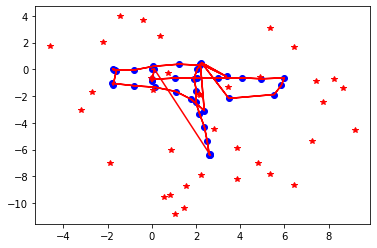

|dX| for step 3 : 0.8253149640679426

linearize and build system


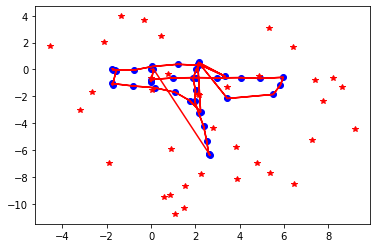

|dX| for step 4 : 0.46679277089278093

linearize and build system


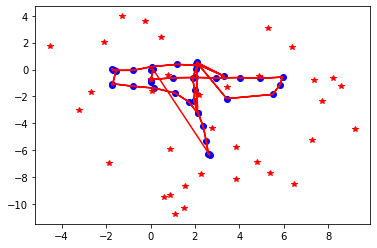

|dX| for step 5 : 0.36406694101499004

linearize and build system


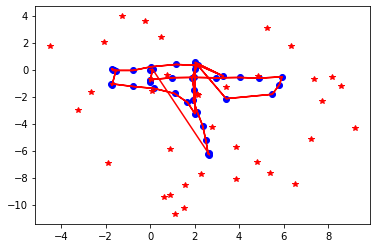

|dX| for step 6 : 0.28675649176104395

linearize and build system


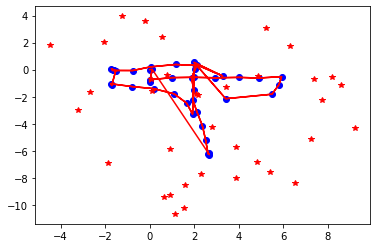

|dX| for step 7 : 0.23801013416961928

linearize and build system


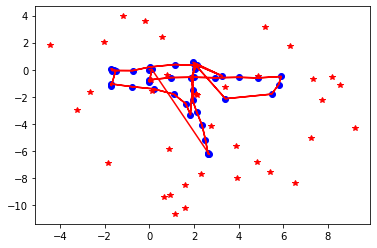

|dX| for step 8 : 0.2064508402760736

linearize and build system


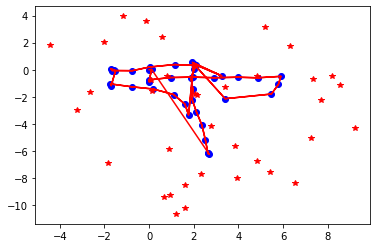

|dX| for step 9 : 0.18408252466273536

linearize and build system


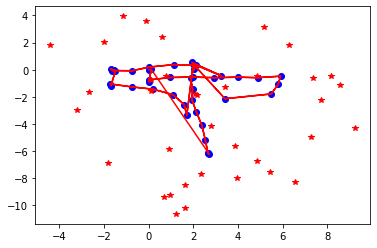

|dX| for step 10 : 0.16926165690743114

linearize and build system


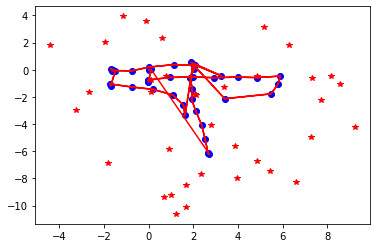

|dX| for step 11 : 0.15927919551036518

linearize and build system


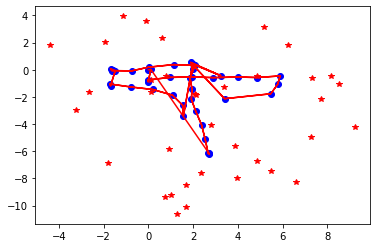

|dX| for step 12 : 0.15342567372524799

linearize and build system


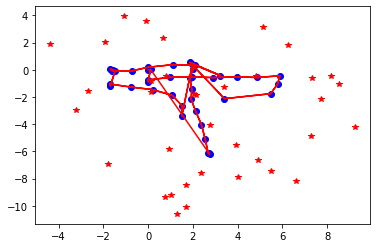

|dX| for step 13 : 0.15079639318423813

linearize and build system


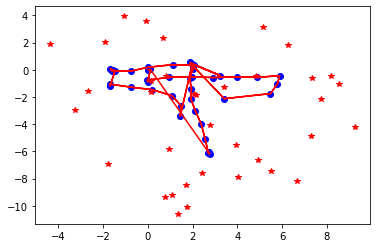

|dX| for step 14 : 0.15112374507520043

linearize and build system


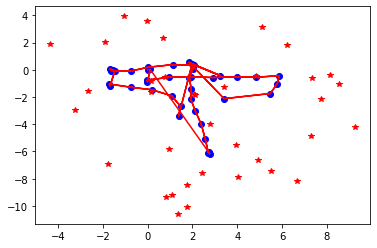

|dX| for step 15 : 0.1543002451387008

linearize and build system


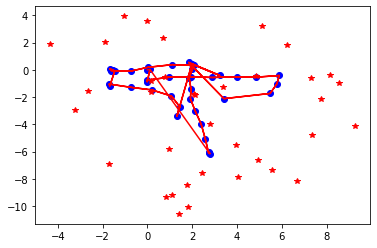

|dX| for step 16 : 0.16039918102913772

linearize and build system


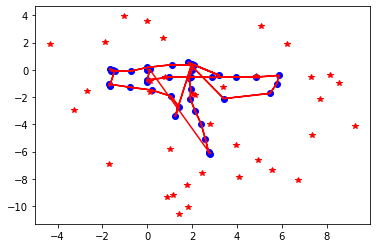

|dX| for step 17 : 0.16974530166538404

linearize and build system


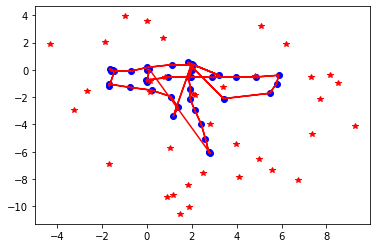

|dX| for step 18 : 0.18291877658260847

linearize and build system


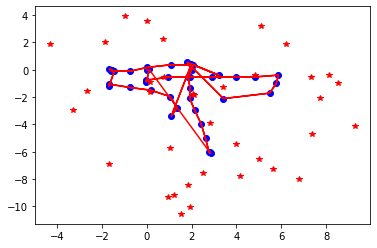

|dX| for step 19 : 0.20072941840066774

linearize and build system


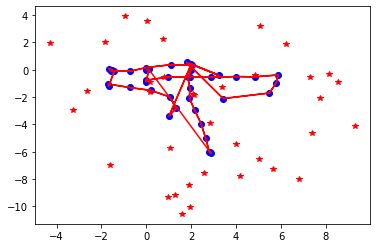

|dX| for step 20 : 0.2244603408290294

linearize and build system


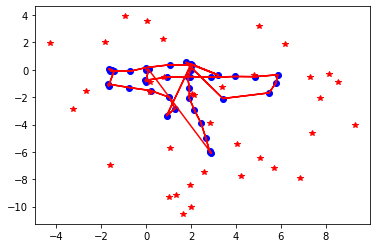

|dX| for step 21 : 0.2559296123668208

linearize and build system


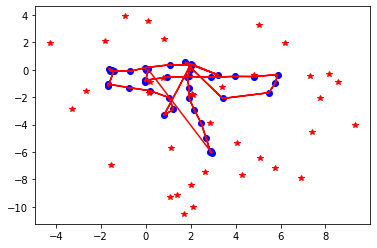

|dX| for step 22 : 0.29777565688128443

linearize and build system


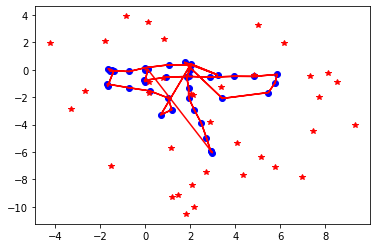

|dX| for step 23 : 0.35387417245666497

linearize and build system


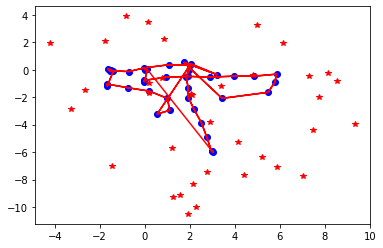

|dX| for step 24 : 0.42966284974830604

linearize and build system


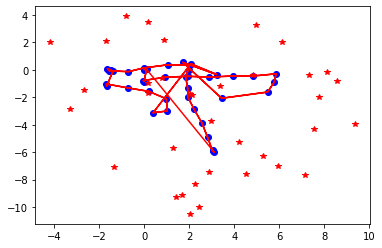

|dX| for step 25 : 0.5329187851427507

linearize and build system


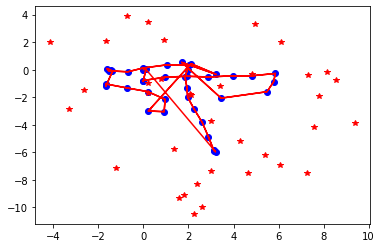

|dX| for step 26 : 0.6740387842515974

linearize and build system


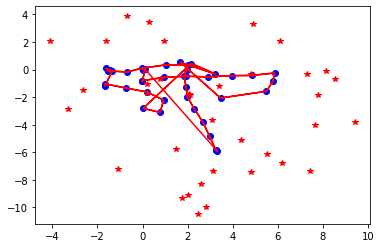

|dX| for step 27 : 0.864744223522023

linearize and build system


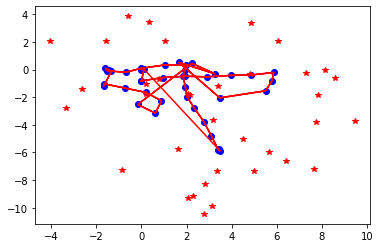

|dX| for step 28 : 1.1121412764787884

linearize and build system


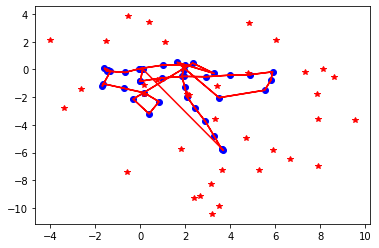

|dX| for step 29 : 1.4008802920478602

linearize and build system


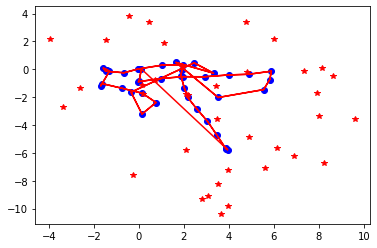

|dX| for step 30 : 1.65726188145742

linearize and build system


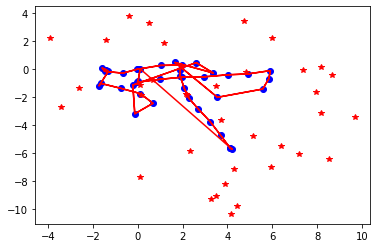

|dX| for step 31 : 1.7268091627602087

linearize and build system


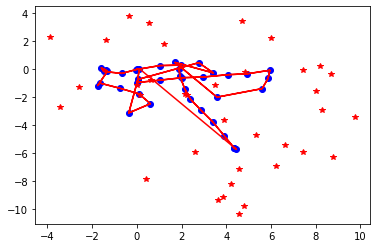

|dX| for step 32 : 1.473421238046449

linearize and build system


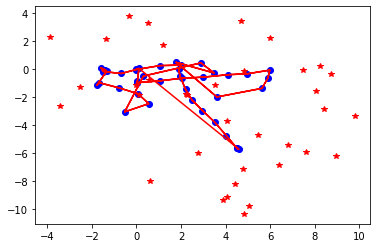

|dX| for step 33 : 0.9996251311234018

linearize and build system


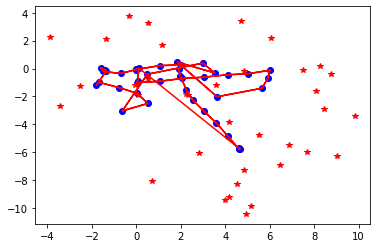

|dX| for step 34 : 0.5863623946796641

linearize and build system


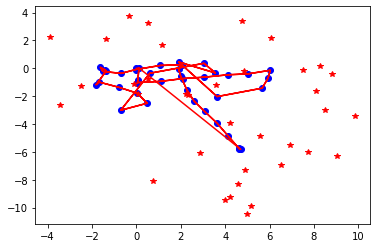

|dX| for step 35 : 0.3441508477620433

linearize and build system


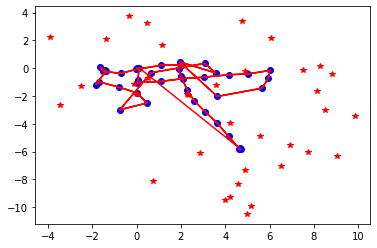

|dX| for step 36 : 0.20987188881765786

linearize and build system


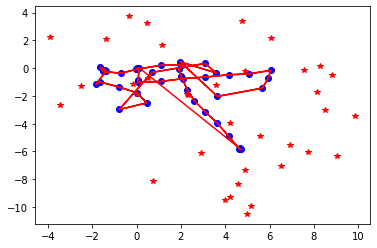

|dX| for step 37 : 0.12805154835723243

linearize and build system


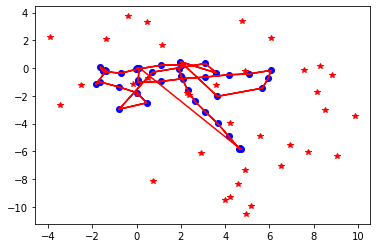

|dX| for step 38 : 0.07669582200730382

linearize and build system


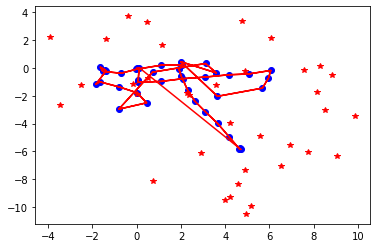

|dX| for step 39 : 0.04517388534996423

linearize and build system


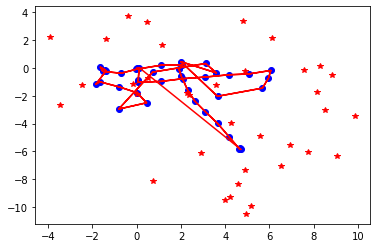

|dX| for step 40 : 0.02630449817953083

linearize and build system


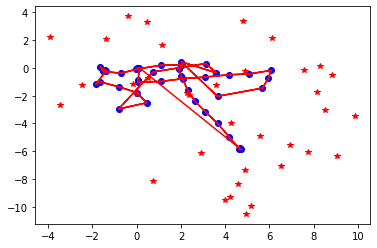

|dX| for step 41 : 0.01522256966110132

linearize and build system


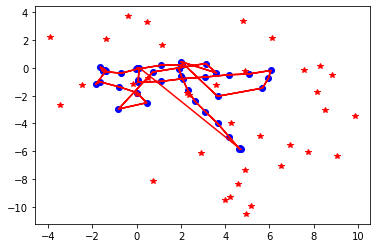

|dX| for step 42 : 0.008782359732291883

linearize and build system


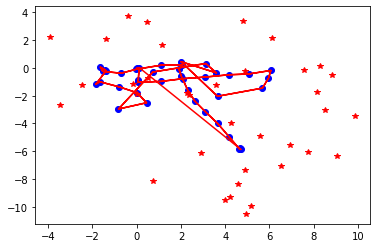

|dX| for step 43 : 0.005070434134071874

linearize and build system


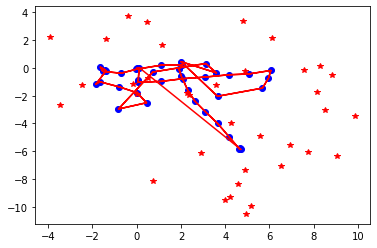

|dX| for step 44 : 0.0029431276162442534

linearize and build system


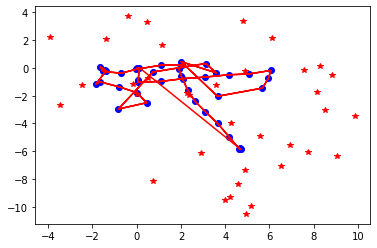

|dX| for step 45 : 0.0016964000821677553

linearize and build system


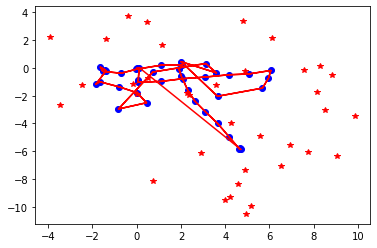

|dX| for step 46 : 0.0009723246949954139

linearize and build system


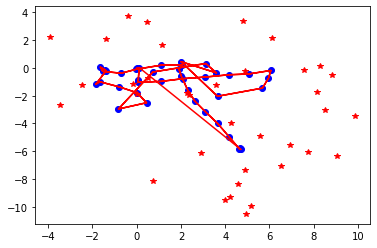

|dX| for step 47 : 0.0005666789000806463

linearize and build system


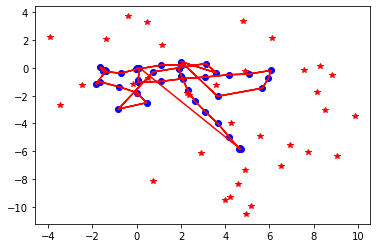

|dX| for step 48 : 0.00033525256162588476

linearize and build system


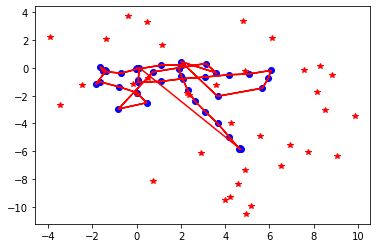

|dX| for step 49 : 0.00019314557292536363

linearize and build system


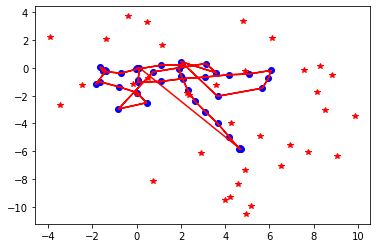

|dX| for step 50 : 0.00010989798108133349



In [6]:
filename = 'simulation-pose-landmark.g2o'
g = ex5.read_graph_g2o(filename)
err_pl = ex5.run_graph_slam(g, 100)

Loaded graph with 400 nodes and 1773 edges
linearize and build system


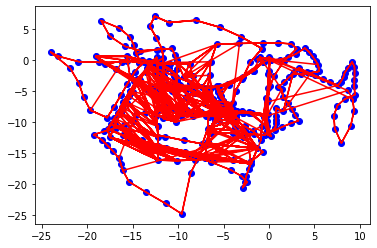

|dX| for step 0 : 291.99576062070224

linearize and build system


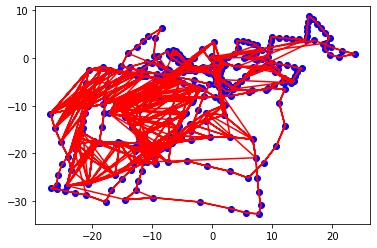

|dX| for step 1 : 258.7601899117344

linearize and build system


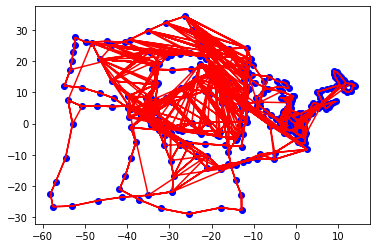

|dX| for step 2 : 479.79130960110075

linearize and build system


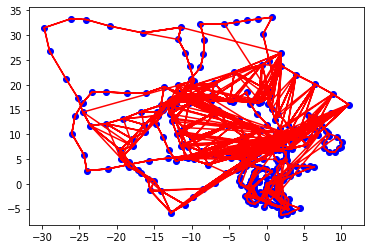

|dX| for step 3 : 413.2942937699345

linearize and build system


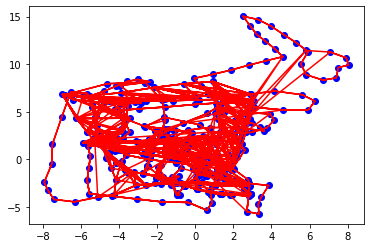

|dX| for step 4 : 236.26005477189423

linearize and build system


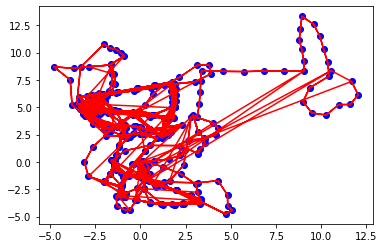

|dX| for step 5 : 67.52780274298883

linearize and build system


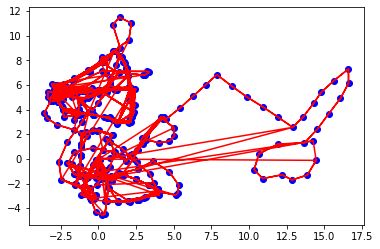

|dX| for step 6 : 46.245768731578224

linearize and build system


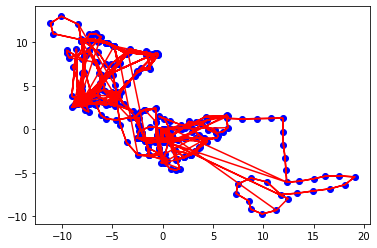

|dX| for step 7 : 107.49392383313008

linearize and build system


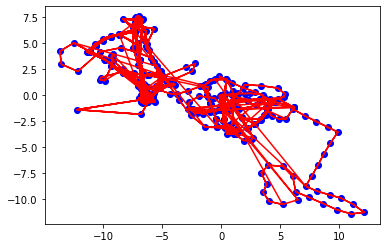

|dX| for step 8 : 77.54769011737632

linearize and build system


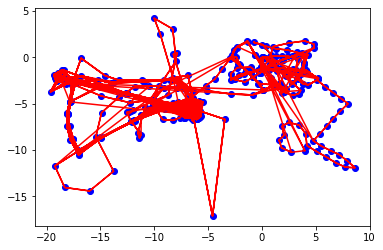

|dX| for step 9 : 148.1500788977513

linearize and build system


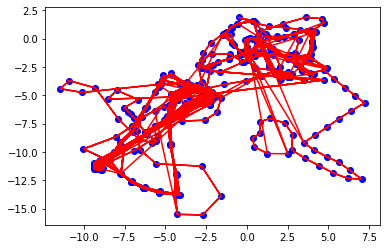

|dX| for step 10 : 120.89322084787142

linearize and build system


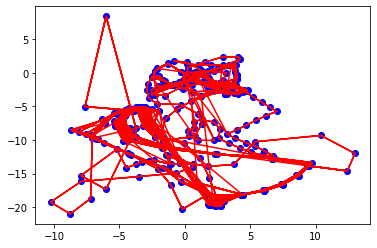

|dX| for step 11 : 132.7465463523892

linearize and build system


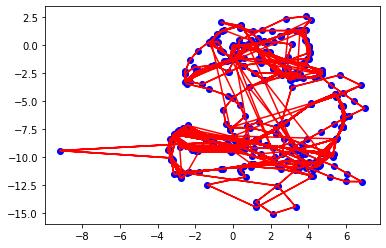

|dX| for step 12 : 94.56661164783091

linearize and build system


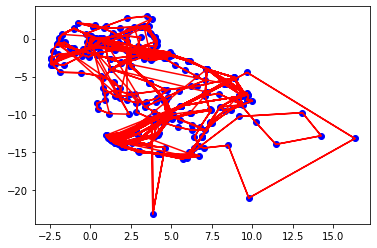

|dX| for step 13 : 92.0959342300961

linearize and build system


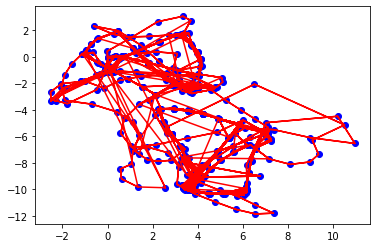

|dX| for step 14 : 56.41295842258606

linearize and build system


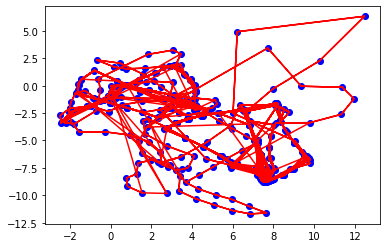

|dX| for step 15 : 55.638400244021305

linearize and build system


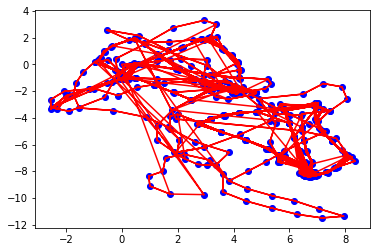

|dX| for step 16 : 27.587852141855773

linearize and build system


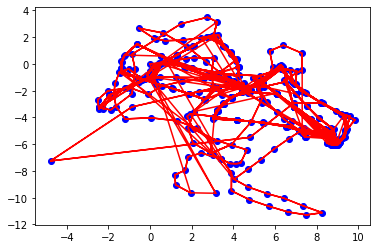

|dX| for step 17 : 38.64231855240213

linearize and build system


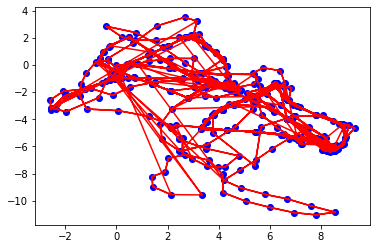

|dX| for step 18 : 17.101825813236122

linearize and build system


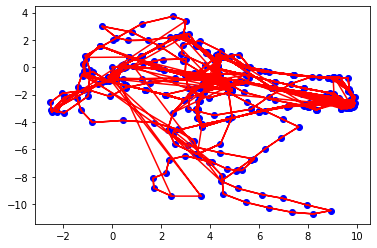

|dX| for step 19 : 40.4570049424267

linearize and build system


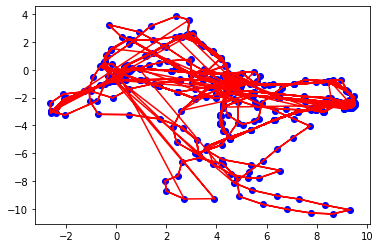

|dX| for step 20 : 13.7015842991629

linearize and build system


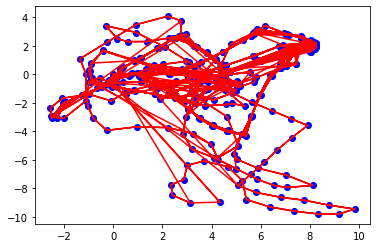

|dX| for step 21 : 49.38482713615563

linearize and build system


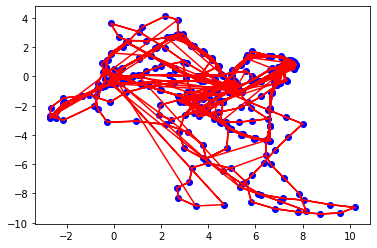

|dX| for step 22 : 22.70985127792144

linearize and build system


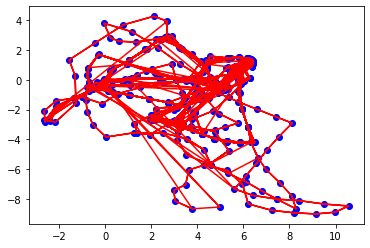

|dX| for step 23 : 16.271219239505903

linearize and build system


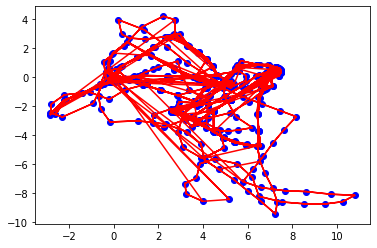

|dX| for step 24 : 14.813444987950131

linearize and build system


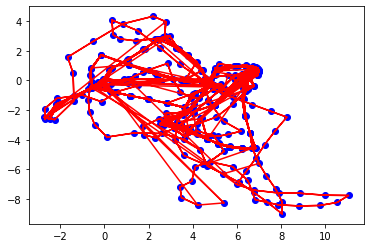

|dX| for step 25 : 8.777188208937165

linearize and build system


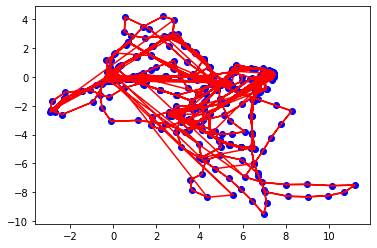

|dX| for step 26 : 9.342266623908905

linearize and build system


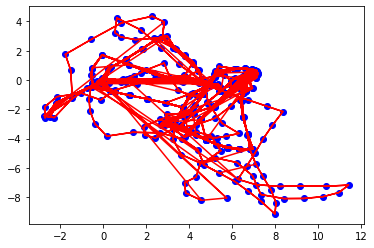

|dX| for step 27 : 8.13679180026138

linearize and build system


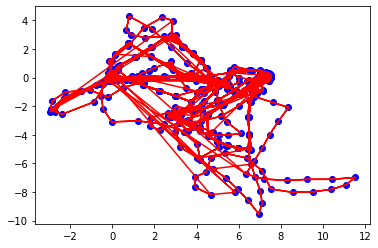

|dX| for step 28 : 8.452604709085952

linearize and build system


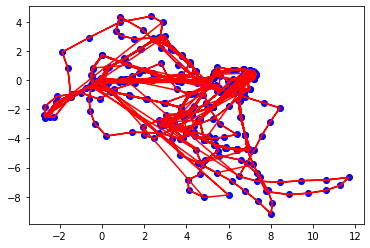

|dX| for step 29 : 8.271150567470778

linearize and build system


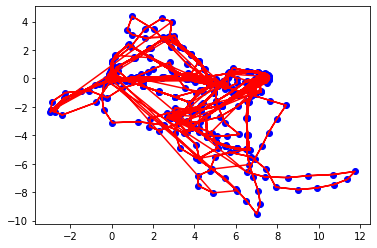

|dX| for step 30 : 8.369738390879121

linearize and build system


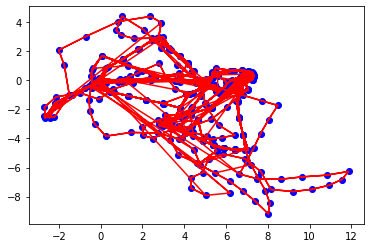

|dX| for step 31 : 8.410865705696404

linearize and build system


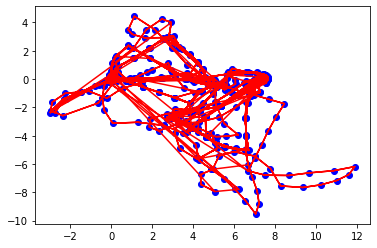

|dX| for step 32 : 8.520474548341406

linearize and build system


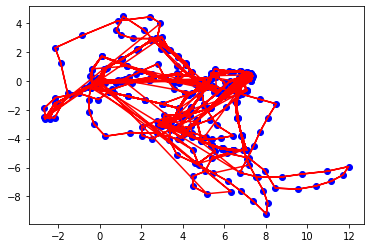

|dX| for step 33 : 8.60661636902047

linearize and build system


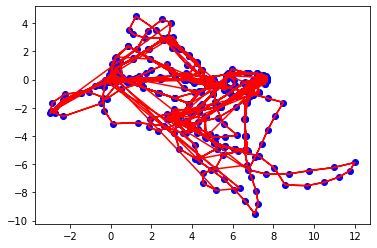

|dX| for step 34 : 8.797413988078215

linearize and build system


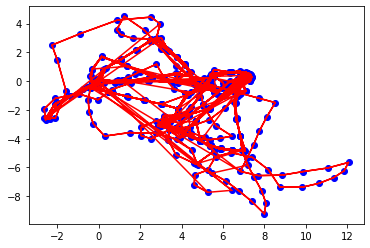

|dX| for step 35 : 8.88468204925032

linearize and build system


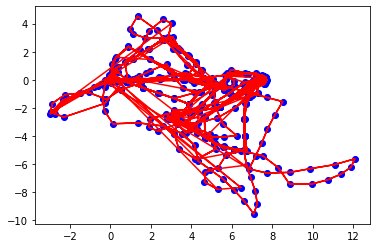

|dX| for step 36 : 9.143685285801102

linearize and build system


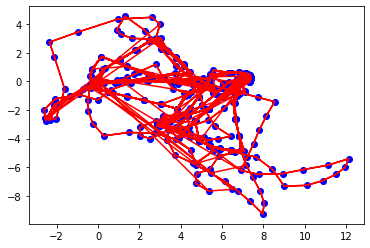

|dX| for step 37 : 9.215335610742981

linearize and build system


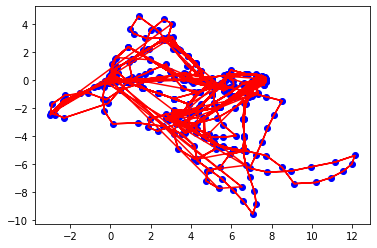

|dX| for step 38 : 9.489889214163247

linearize and build system


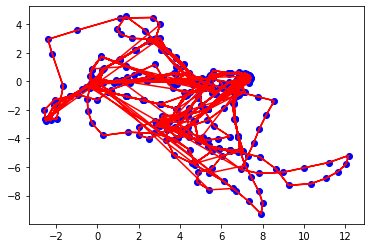

|dX| for step 39 : 9.531170217661732

linearize and build system


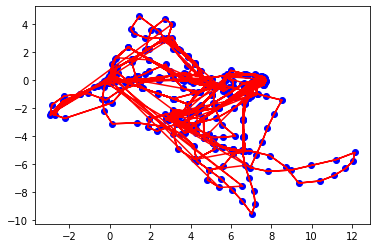

|dX| for step 40 : 9.769316708174488

linearize and build system


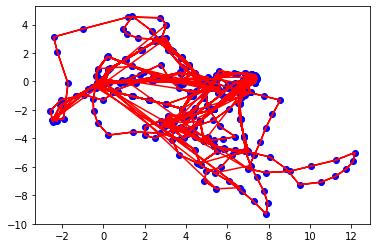

|dX| for step 41 : 9.771694530057413

linearize and build system


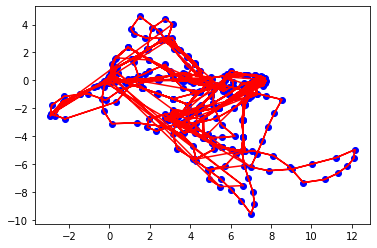

|dX| for step 42 : 9.94997999107596

linearize and build system


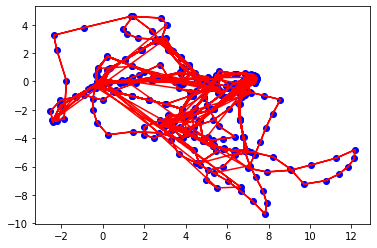

|dX| for step 43 : 9.91983164265355

linearize and build system


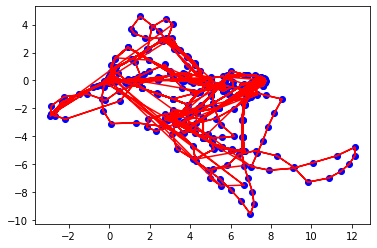

|dX| for step 44 : 10.043431735587811

linearize and build system


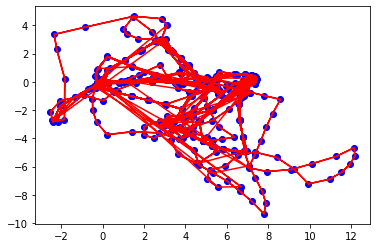

|dX| for step 45 : 9.998787152760318

linearize and build system


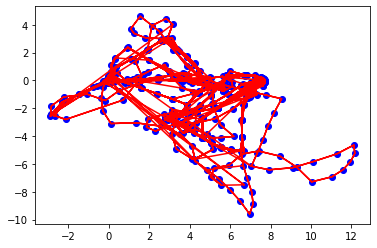

|dX| for step 46 : 10.08422563736066

linearize and build system


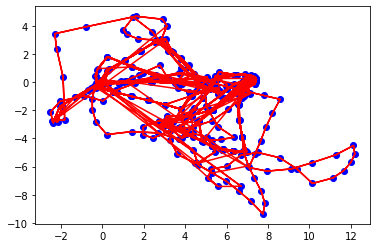

|dX| for step 47 : 10.042559161699472

linearize and build system


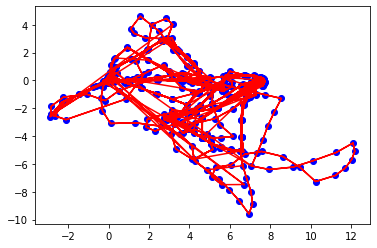

|dX| for step 48 : 10.103049509558172

linearize and build system


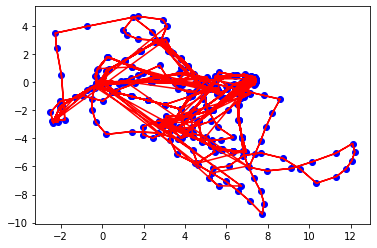

|dX| for step 49 : 10.071832351228286

linearize and build system


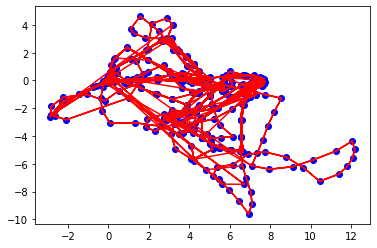

|dX| for step 50 : 10.113738818089798

linearize and build system


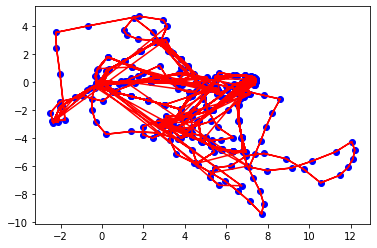

|dX| for step 51 : 10.091087462762523

linearize and build system


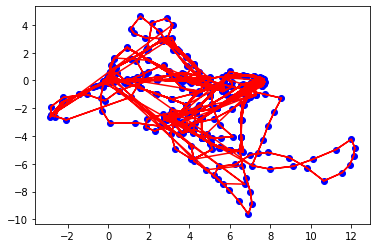

|dX| for step 52 : 10.116395400035824

linearize and build system


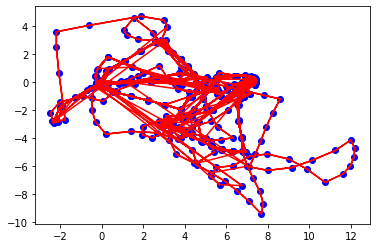

|dX| for step 53 : 10.097022085744591

linearize and build system


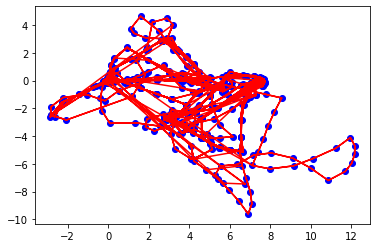

|dX| for step 54 : 10.106966932591085

linearize and build system


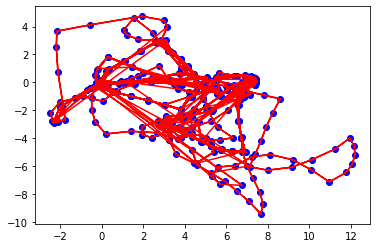

|dX| for step 55 : 10.086720111175975

linearize and build system


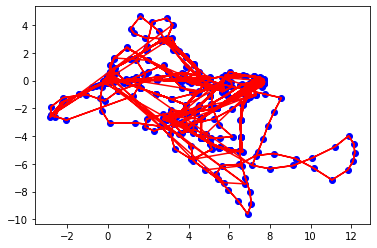

|dX| for step 56 : 10.083192536220189

linearize and build system


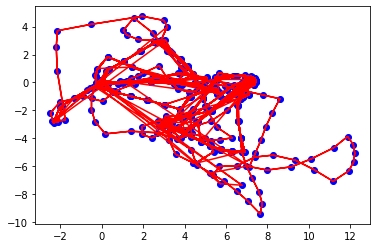

|dX| for step 57 : 10.06052986739482

linearize and build system


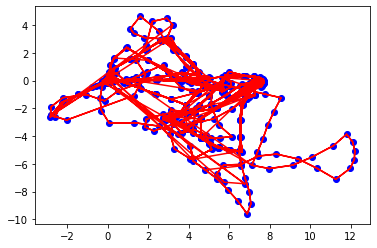

|dX| for step 58 : 10.046410303642835

linearize and build system


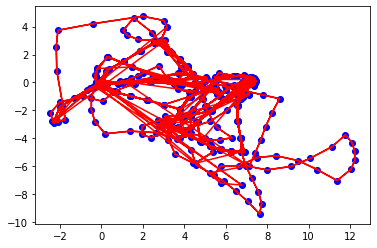

|dX| for step 59 : 10.02168380221692

linearize and build system


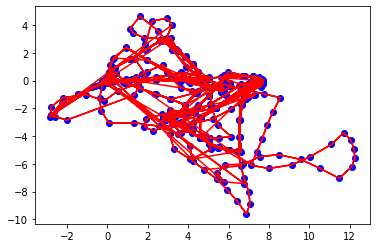

|dX| for step 60 : 10.00037464988775

linearize and build system


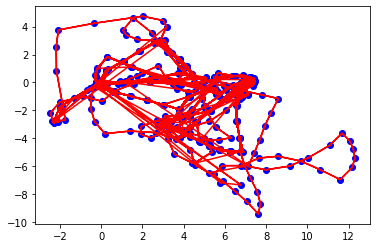

|dX| for step 61 : 9.975247970300789

linearize and build system


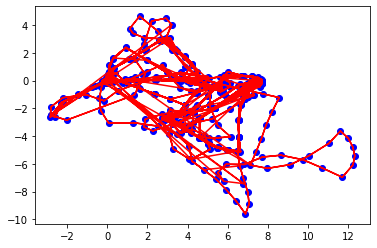

|dX| for step 62 : 9.94989106571221

linearize and build system


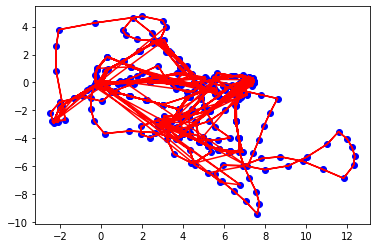

|dX| for step 63 : 9.925766786402294

linearize and build system


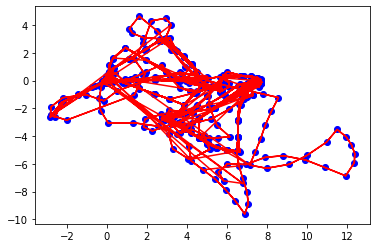

|dX| for step 64 : 9.898875177782173

linearize and build system


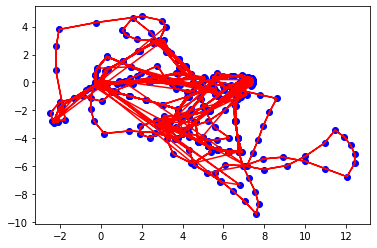

|dX| for step 65 : 9.876934998927736

linearize and build system


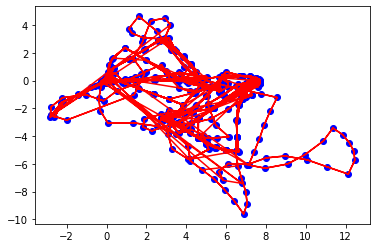

|dX| for step 66 : 9.850178056605156

linearize and build system


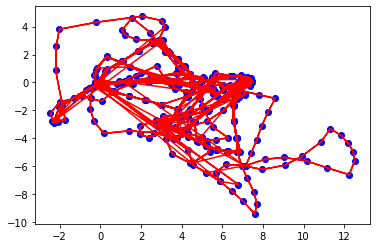

|dX| for step 67 : 9.830834494281376

linearize and build system


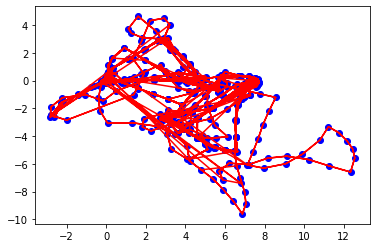

|dX| for step 68 : 9.805243826490535

linearize and build system


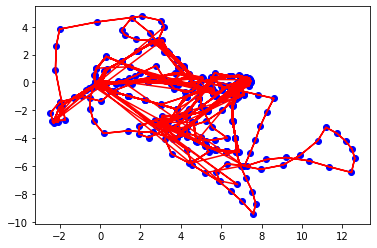

|dX| for step 69 : 9.788577481645994

linearize and build system


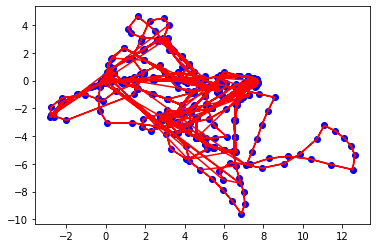

|dX| for step 70 : 9.764589946074663

linearize and build system


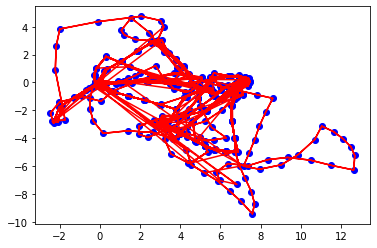

|dX| for step 71 : 9.750286891508697

linearize and build system


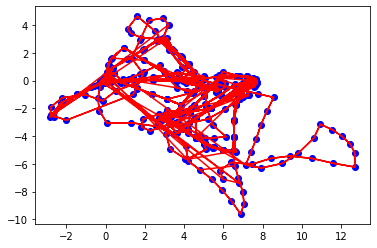

|dX| for step 72 : 9.728113319381153

linearize and build system


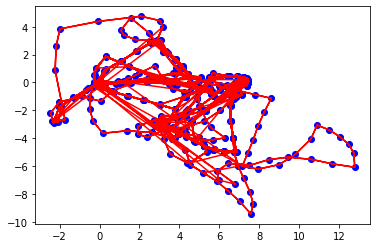

|dX| for step 73 : 9.715809459528737

linearize and build system


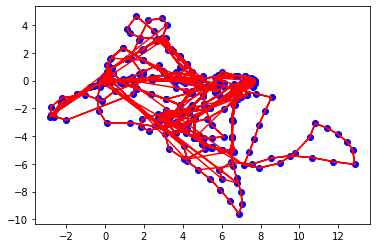

|dX| for step 74 : 9.695676492915624

linearize and build system


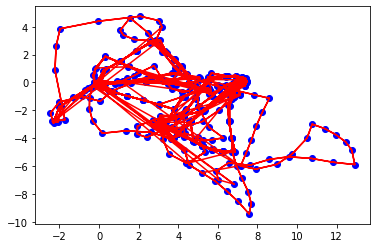

|dX| for step 75 : 9.684860201642595

linearize and build system


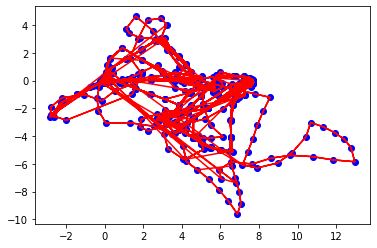

|dX| for step 76 : 9.666746682626322

linearize and build system


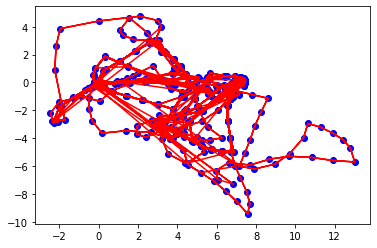

|dX| for step 77 : 9.657056210318308

linearize and build system


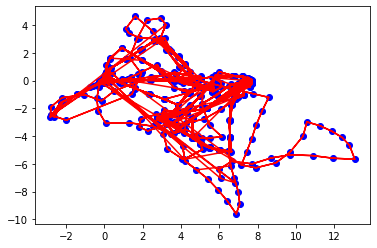

|dX| for step 78 : 9.641086500090868

linearize and build system


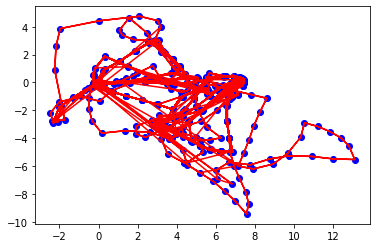

|dX| for step 79 : 9.632329343698329

linearize and build system


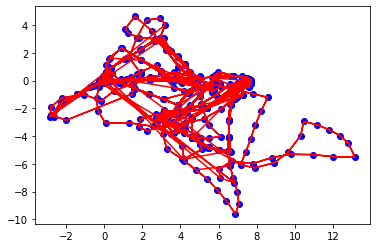

|dX| for step 80 : 9.618313092949178

linearize and build system


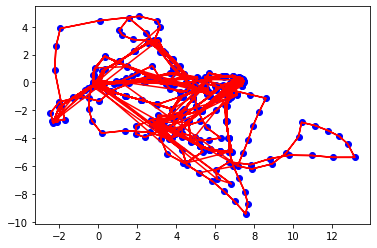

|dX| for step 81 : 9.610240104481102

linearize and build system


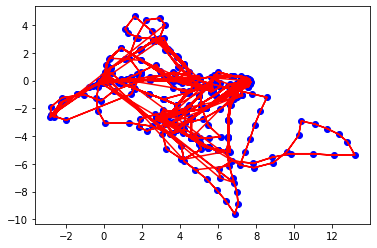

|dX| for step 82 : 9.598157820059326

linearize and build system


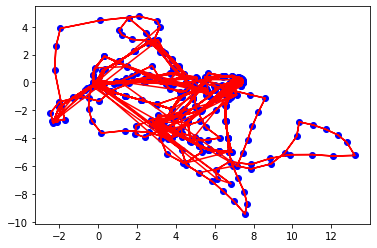

|dX| for step 83 : 9.59064313678519

linearize and build system


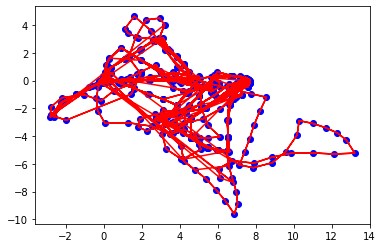

|dX| for step 84 : 9.580335769319142

linearize and build system


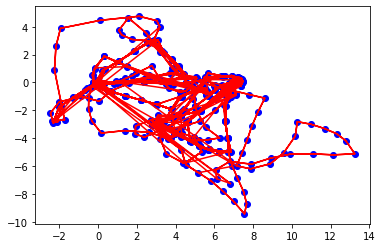

|dX| for step 85 : 9.573244924453356

linearize and build system


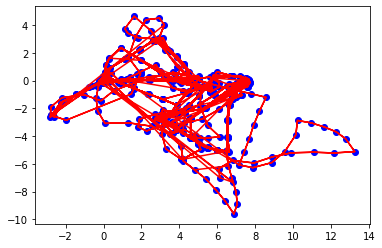

|dX| for step 86 : 9.564501980019159

linearize and build system


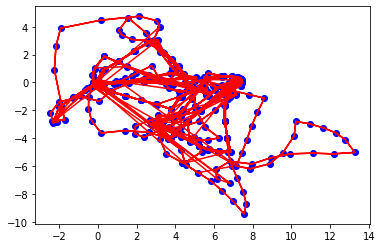

|dX| for step 87 : 9.557856608830008

linearize and build system


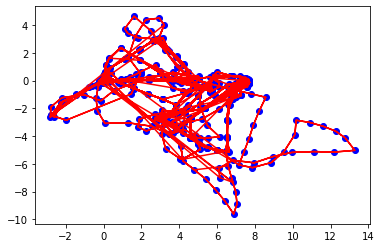

|dX| for step 88 : 9.550448348219009

linearize and build system


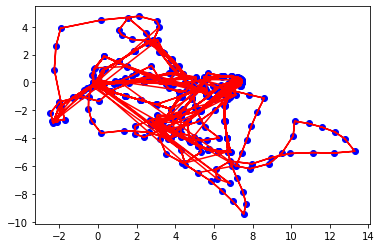

|dX| for step 89 : 9.544118729364843

linearize and build system


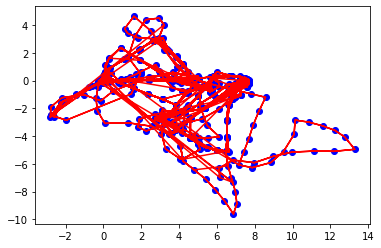

|dX| for step 90 : 9.537971827874642

linearize and build system


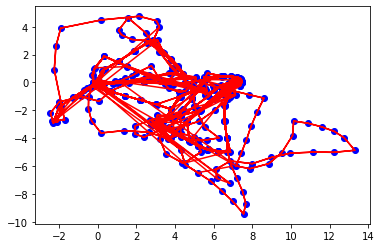

|dX| for step 91 : 9.532000987323062

linearize and build system


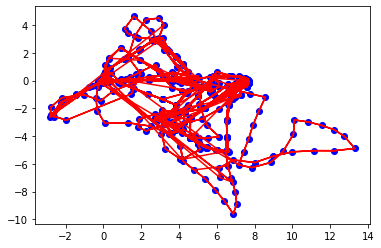

|dX| for step 92 : 9.526829222318174

linearize and build system


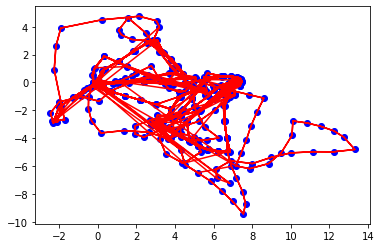

|dX| for step 93 : 9.521222254959776

linearize and build system


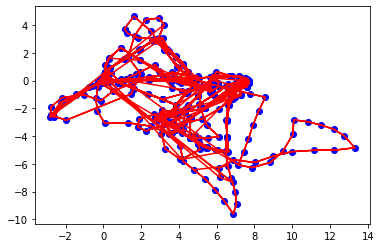

|dX| for step 94 : 9.51693837524578

linearize and build system


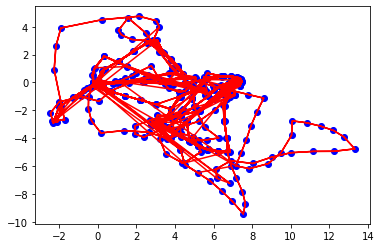

|dX| for step 95 : 9.511637598201716

linearize and build system


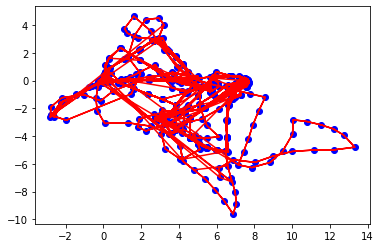

|dX| for step 96 : 9.508080954623647

linearize and build system


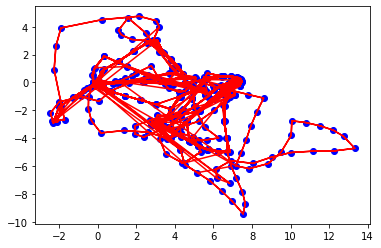

|dX| for step 97 : 9.503112690752582

linearize and build system


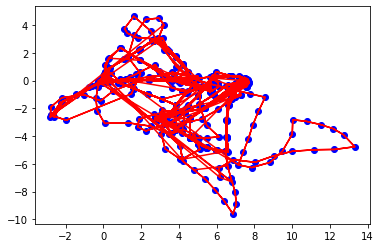

|dX| for step 98 : 9.500064779689017

linearize and build system


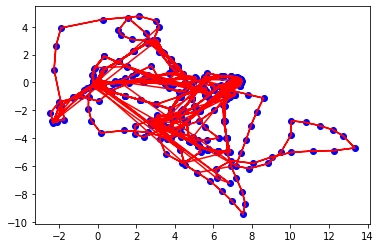

|dX| for step 99 : 9.495421792351335



In [7]:
filename = 'simulation-pose-pose.g2o'
g = ex5.read_graph_g2o(filename)
err_pp = ex5.run_graph_slam(g, 100)

### Real Datasets

Loaded graph with 3873 nodes and 17605 edges
linearize and build system


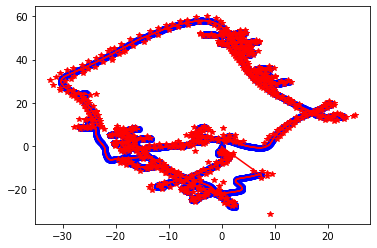

|dX| for step 0 : 980.3424124446815

linearize and build system


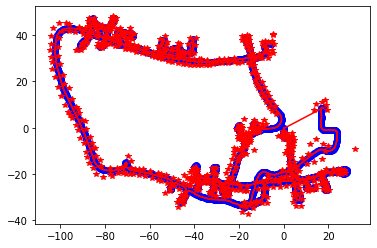

|dX| for step 1 : 3161.691150128412

linearize and build system


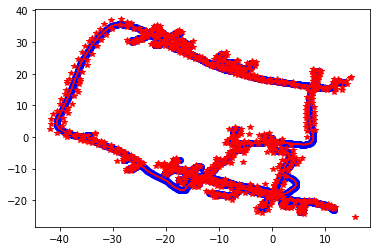

|dX| for step 2 : 2264.795351129688

linearize and build system


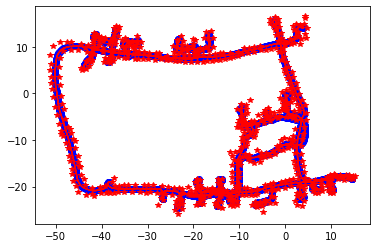

|dX| for step 3 : 1039.4628046326536

linearize and build system


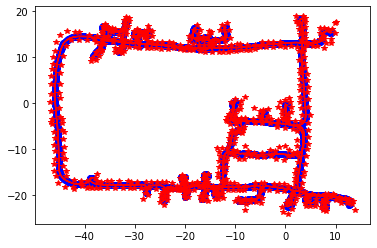

|dX| for step 4 : 294.1878185344775

linearize and build system


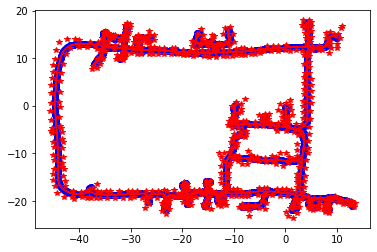

|dX| for step 5 : 72.12729386529301

linearize and build system


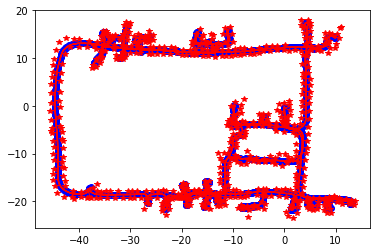

|dX| for step 6 : 8.9463883537576

linearize and build system


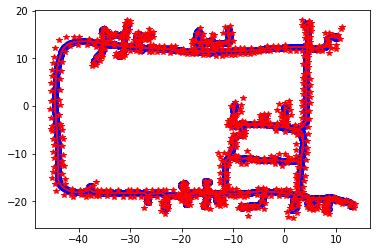

|dX| for step 7 : 17.37481498850662

linearize and build system


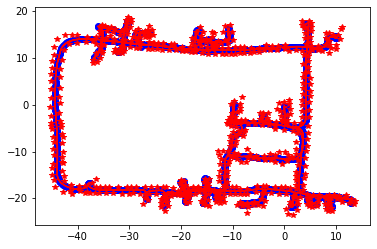

|dX| for step 8 : 21.712509557584163

linearize and build system


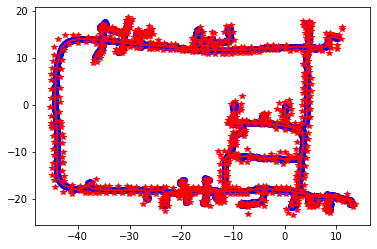

|dX| for step 9 : 7.322000875816932

linearize and build system


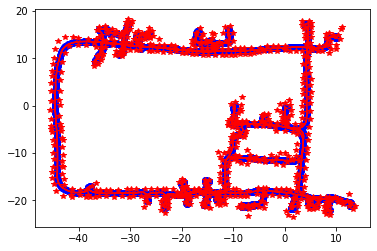

|dX| for step 10 : 16.20365183130175

linearize and build system


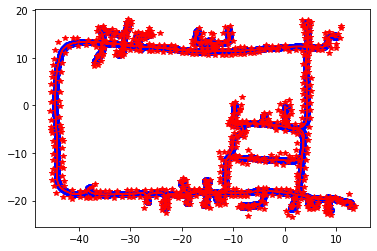

|dX| for step 11 : 9.180638426239414

linearize and build system


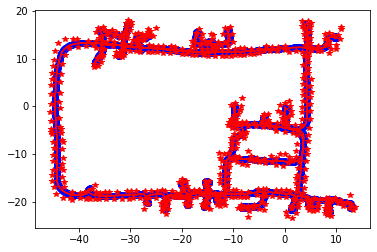

|dX| for step 12 : 3.096698024255823

linearize and build system


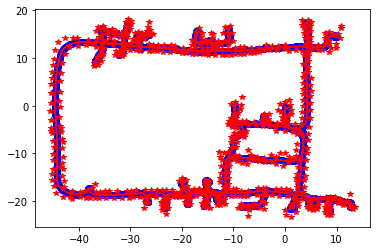

|dX| for step 13 : 3.5035285175929918

linearize and build system


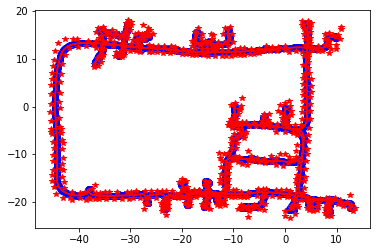

|dX| for step 14 : 2.757505329588271

linearize and build system


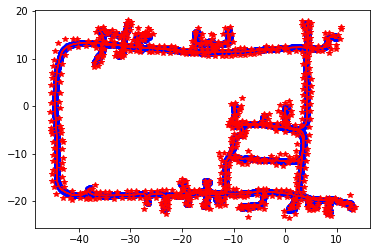

|dX| for step 15 : 2.9879813372915653

linearize and build system


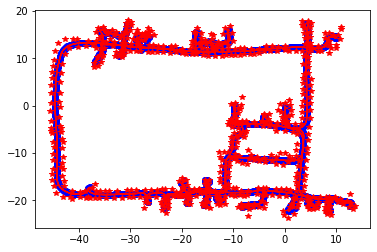

|dX| for step 16 : 3.24736589630997

linearize and build system


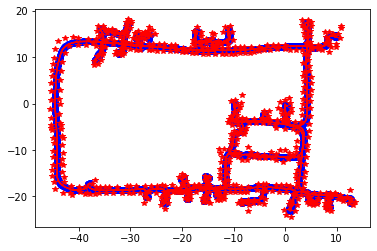

|dX| for step 17 : 6.953928800307417

linearize and build system


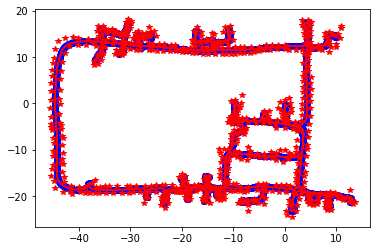

|dX| for step 18 : 3.5059298568130215

linearize and build system


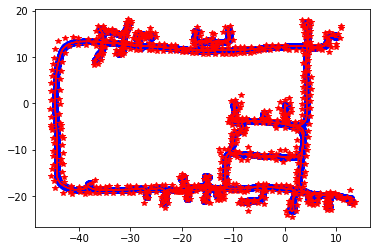

|dX| for step 19 : 2.232368658541159

linearize and build system


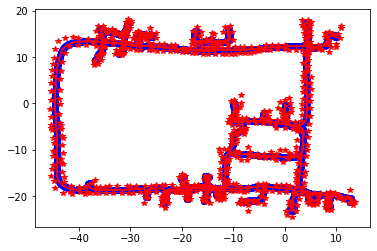

|dX| for step 20 : 1.3258993569621225

linearize and build system


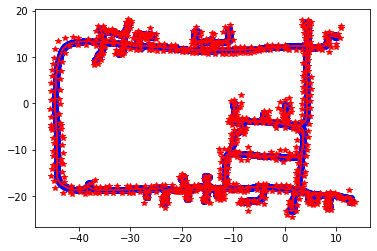

|dX| for step 21 : 0.9664182290972462

linearize and build system


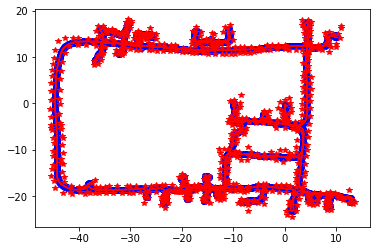

|dX| for step 22 : 0.6786953805876595

linearize and build system


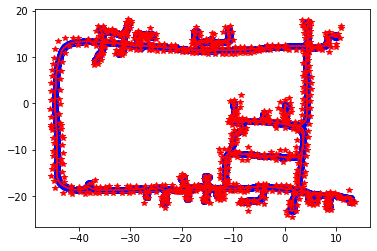

|dX| for step 23 : 0.5424015318983271

linearize and build system


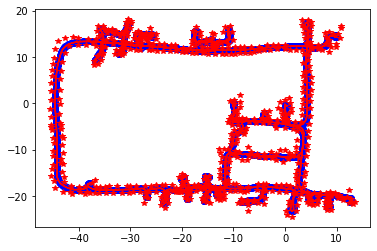

|dX| for step 24 : 0.4959703217355396

linearize and build system


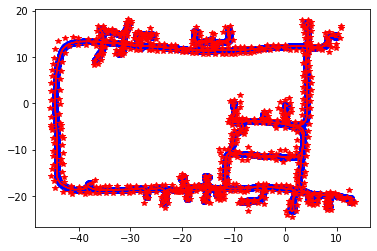

|dX| for step 25 : 0.5076526948499323

linearize and build system


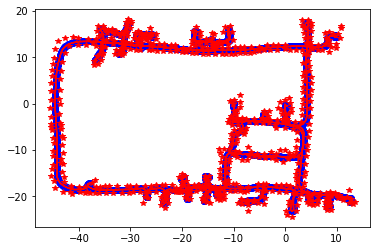

|dX| for step 26 : 0.5536179246651614

linearize and build system


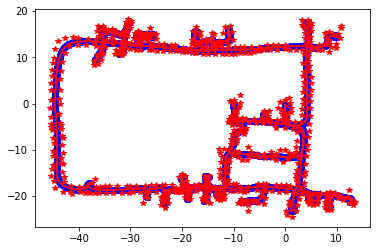

|dX| for step 27 : 0.6471164189078622

linearize and build system


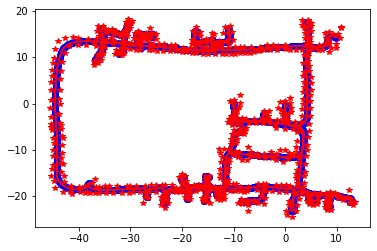

|dX| for step 28 : 0.7715727636086962

linearize and build system


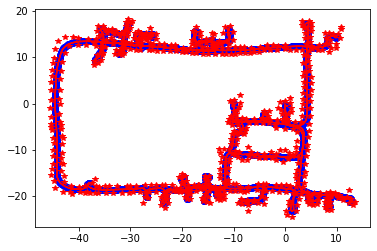

|dX| for step 29 : 0.9538112496309977

linearize and build system


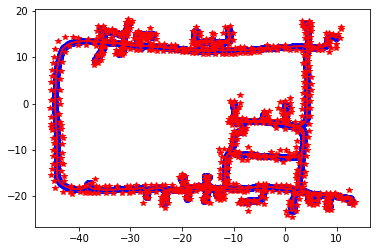

|dX| for step 30 : 1.1841028707788384

linearize and build system


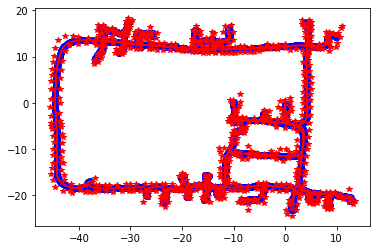

|dX| for step 31 : 1.4822683485934107

linearize and build system


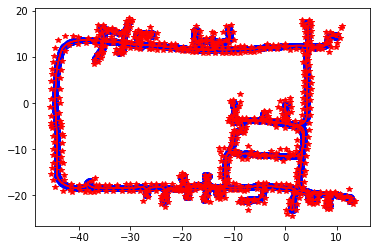

|dX| for step 32 : 1.7813892222005354

linearize and build system


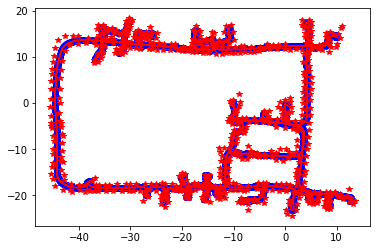

|dX| for step 33 : 1.9840069149801773

linearize and build system


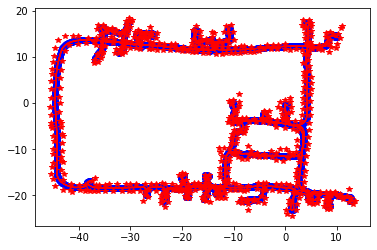

|dX| for step 34 : 1.9034931535597446

linearize and build system


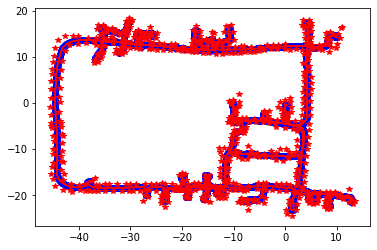

|dX| for step 35 : 1.7024155648268464

linearize and build system


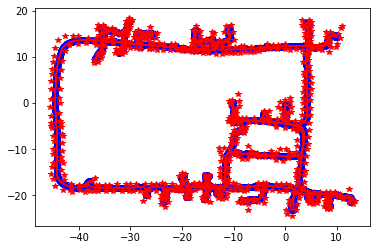

|dX| for step 36 : 2.789673263656219

linearize and build system


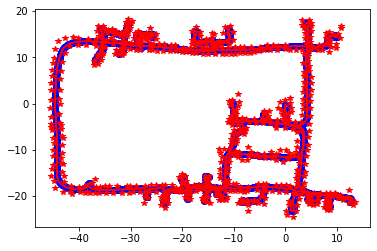

|dX| for step 37 : 6.923264604661145

linearize and build system


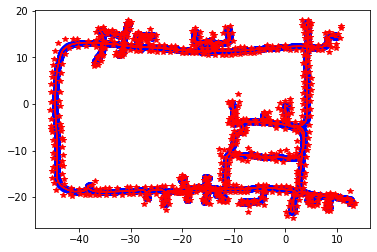

|dX| for step 38 : 9.240051959926042

linearize and build system


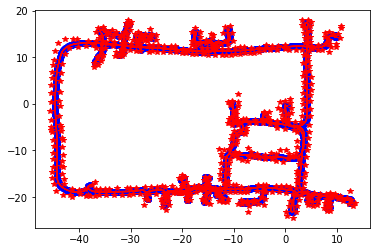

|dX| for step 39 : 3.255166961691945

linearize and build system


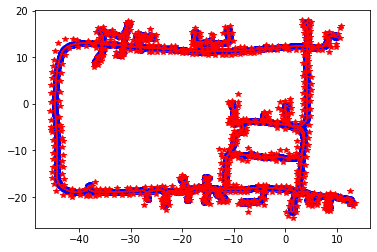

|dX| for step 40 : 0.867148815289926

linearize and build system


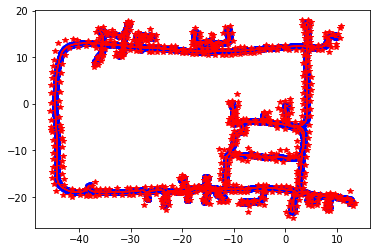

|dX| for step 41 : 0.5871279112015906

linearize and build system


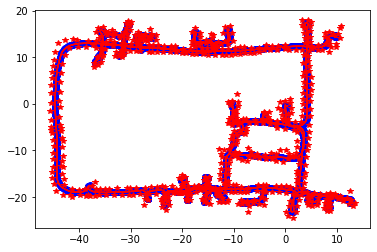

|dX| for step 42 : 0.44907600572121437

linearize and build system


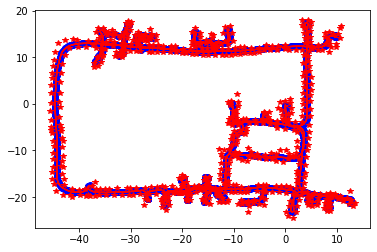

|dX| for step 43 : 0.39180991476109556

linearize and build system


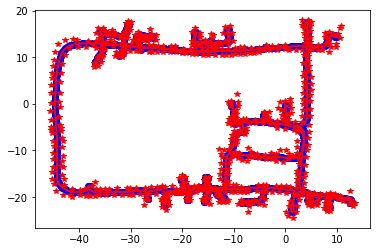

|dX| for step 44 : 0.3715148986303011

linearize and build system


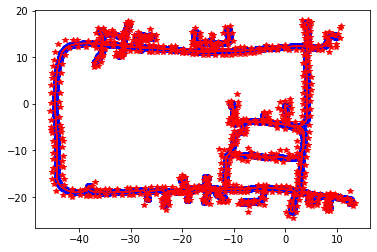

|dX| for step 45 : 0.3685826384063764

linearize and build system


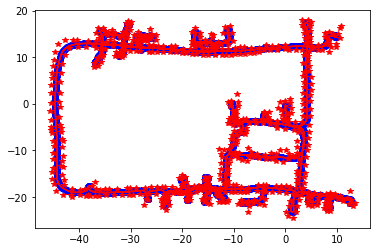

|dX| for step 46 : 0.3746461341020542

linearize and build system


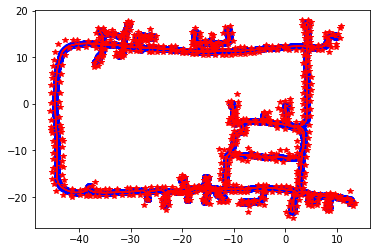

|dX| for step 47 : 0.37480882021825307

linearize and build system


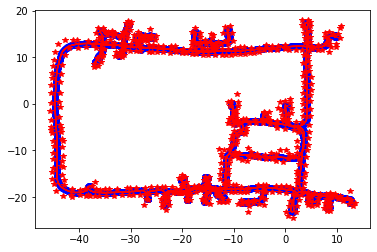

|dX| for step 48 : 0.3649461999809972

linearize and build system


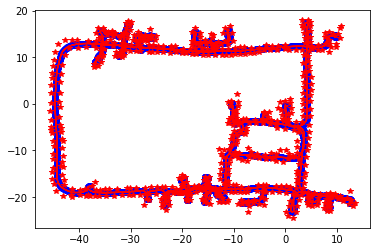

|dX| for step 49 : 0.33992732461195097

linearize and build system


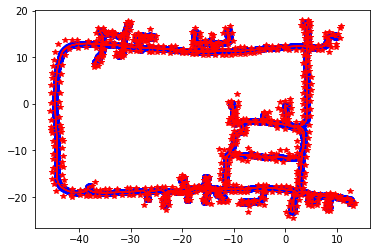

|dX| for step 50 : 0.3073976402898755

linearize and build system


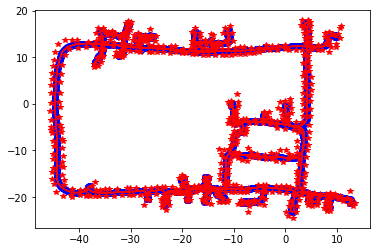

|dX| for step 51 : 0.2732289456685856

linearize and build system


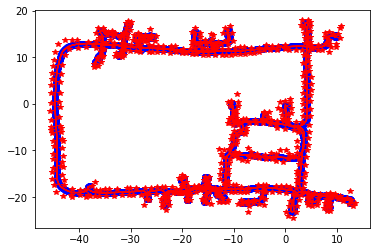

|dX| for step 52 : 0.24233850501508006

linearize and build system


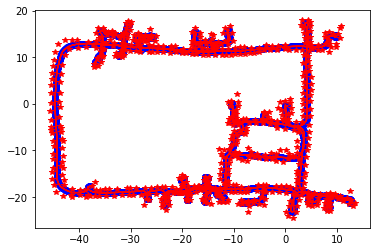

|dX| for step 53 : 0.21895514003629402

linearize and build system


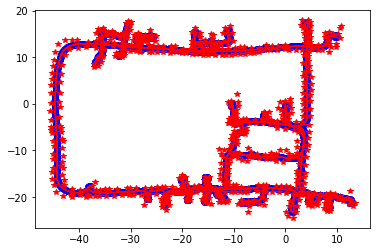

|dX| for step 54 : 0.20212908467039464

linearize and build system


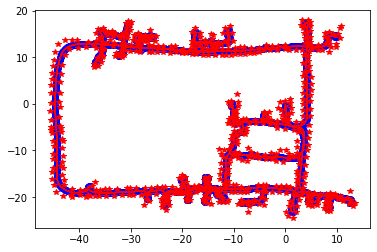

|dX| for step 55 : 0.19453065605665468

linearize and build system


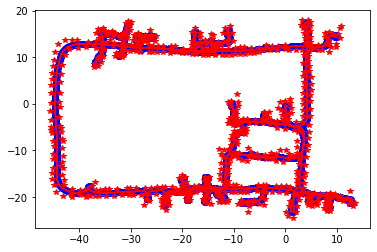

|dX| for step 56 : 0.1931174472396477

linearize and build system


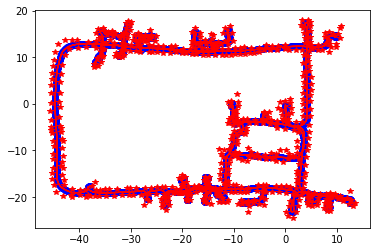

|dX| for step 57 : 0.20051942610997353

linearize and build system


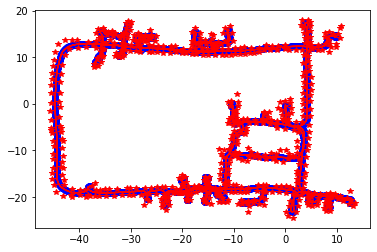

|dX| for step 58 : 0.2161280640691925

linearize and build system


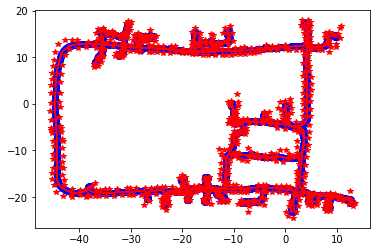

|dX| for step 59 : 0.24065984788338723

linearize and build system


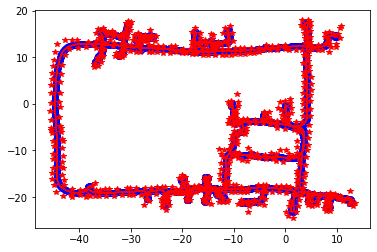

|dX| for step 60 : 0.27112446944361823

linearize and build system


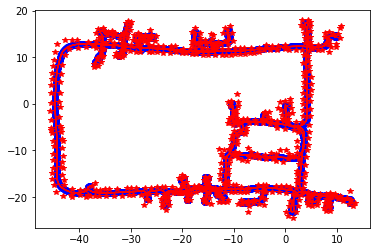

|dX| for step 61 : 0.30141189112532923

linearize and build system


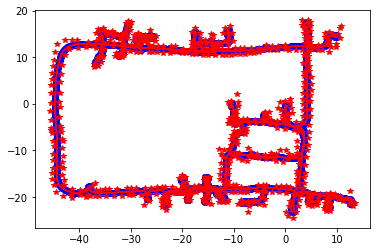

|dX| for step 62 : 0.3177906914287843

linearize and build system


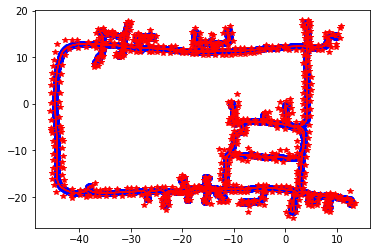

|dX| for step 63 : 0.306291394095544

linearize and build system


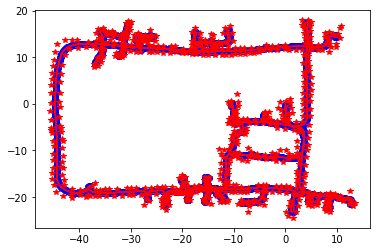

|dX| for step 64 : 0.2713059230612194

linearize and build system


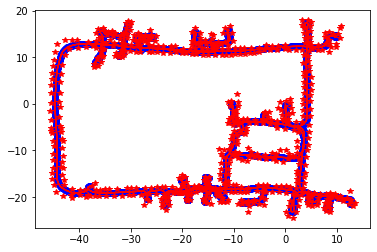

|dX| for step 65 : 0.23803506836644264

linearize and build system


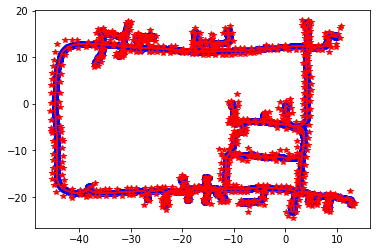

|dX| for step 66 : 0.22440158285887518

linearize and build system


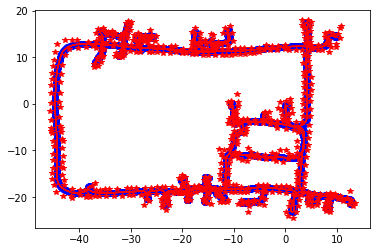

|dX| for step 67 : 0.2289677456832187

linearize and build system


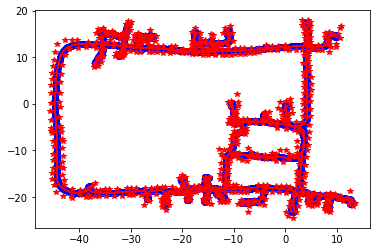

|dX| for step 68 : 0.24321590366887924

linearize and build system


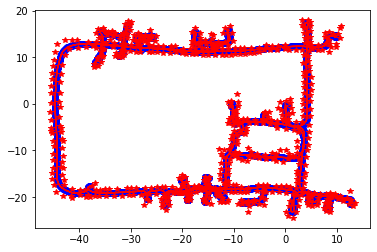

|dX| for step 69 : 0.26389688188140603

linearize and build system


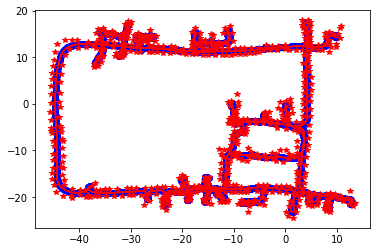

|dX| for step 70 : 0.28673672300907105

linearize and build system


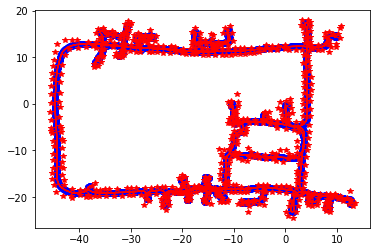

|dX| for step 71 : 0.30183378000846417

linearize and build system


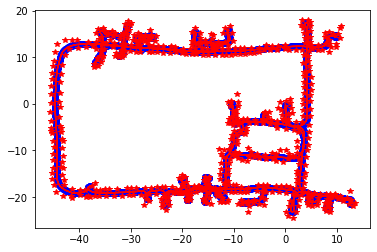

|dX| for step 72 : 0.3068880922019493

linearize and build system


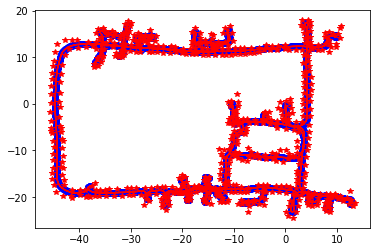

|dX| for step 73 : 0.29835551353209416

linearize and build system


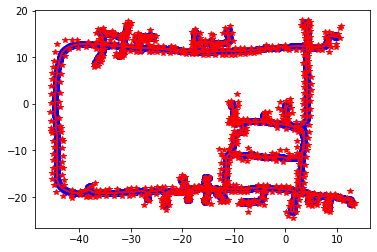

|dX| for step 74 : 0.2768906959502042

linearize and build system


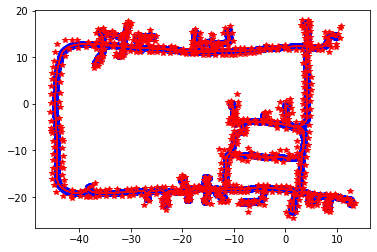

|dX| for step 75 : 0.2523156482061297

linearize and build system


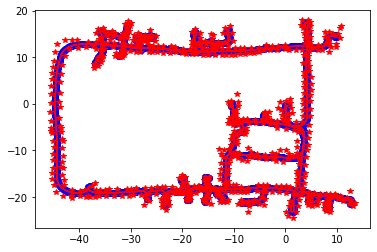

|dX| for step 76 : 0.23685945225866975

linearize and build system


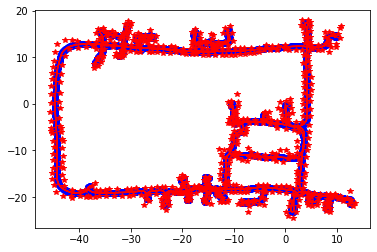

|dX| for step 77 : 0.22892642461556337

linearize and build system


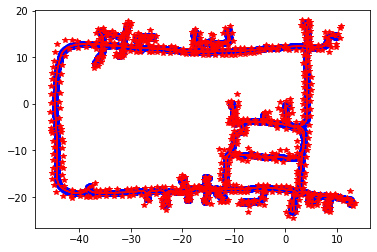

|dX| for step 78 : 0.23200098922299303

linearize and build system


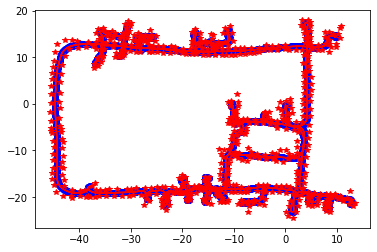

|dX| for step 79 : 0.2441301414481907

linearize and build system


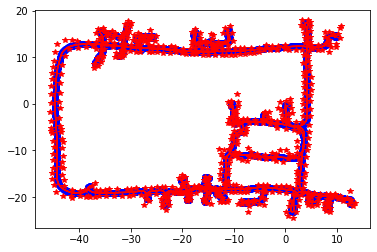

|dX| for step 80 : 0.26265417833650145

linearize and build system


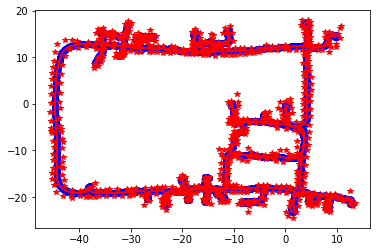

|dX| for step 81 : 0.2887137366443727

linearize and build system


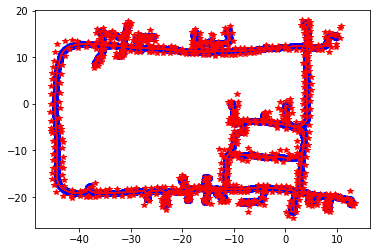

|dX| for step 82 : 0.3231075850862818

linearize and build system


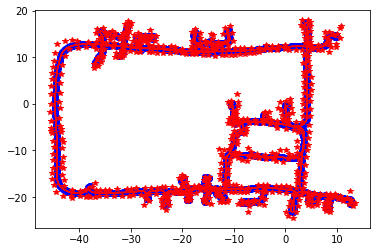

|dX| for step 83 : 0.3620226987627696

linearize and build system


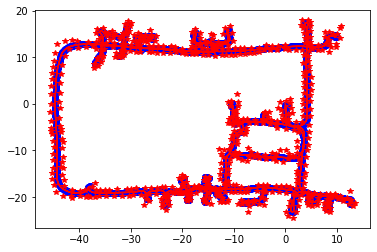

|dX| for step 84 : 0.3976268508463006

linearize and build system


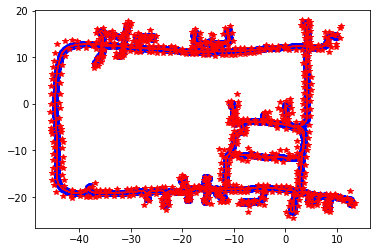

|dX| for step 85 : 0.4134730373654796

linearize and build system


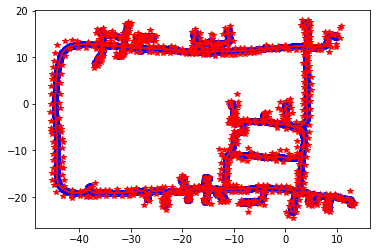

|dX| for step 86 : 0.3978370928151547

linearize and build system


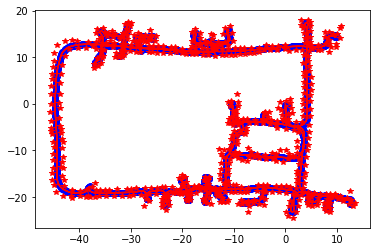

|dX| for step 87 : 0.36816143951281344

linearize and build system


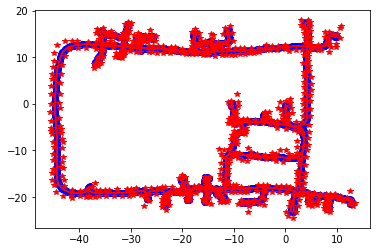

|dX| for step 88 : 0.3394493674738315

linearize and build system


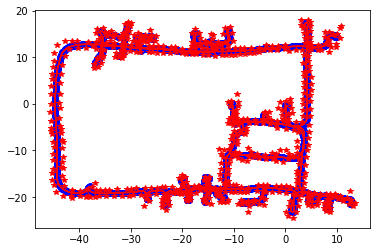

|dX| for step 89 : 0.32828423969512827

linearize and build system


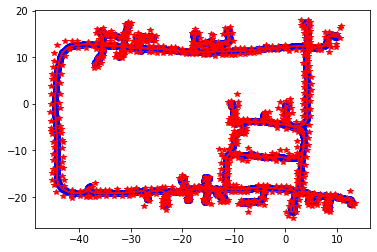

|dX| for step 90 : 0.3419195025217474

linearize and build system


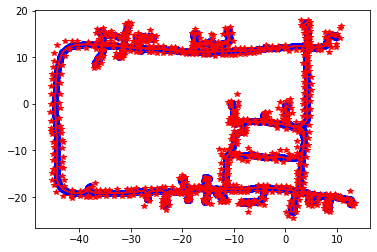

|dX| for step 91 : 0.37639983284683604

linearize and build system


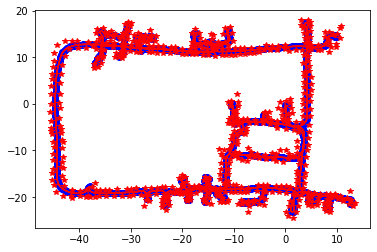

|dX| for step 92 : 0.4332328976464974

linearize and build system


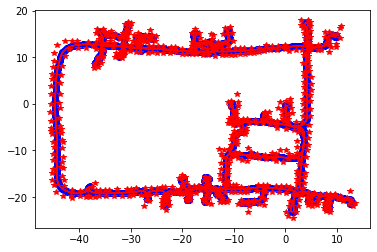

|dX| for step 93 : 0.5184966044858248

linearize and build system


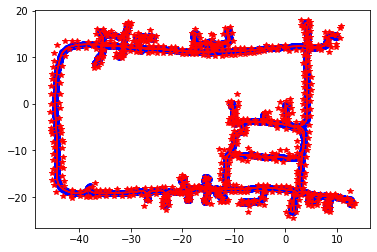

|dX| for step 94 : 0.6410671594653486

linearize and build system


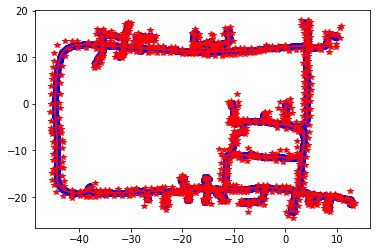

|dX| for step 95 : 0.8087684312293307

linearize and build system


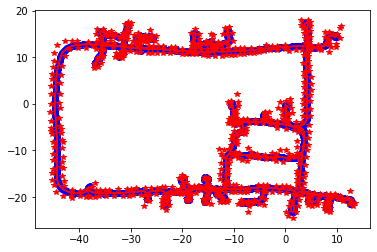

|dX| for step 96 : 1.0005578048857093

linearize and build system


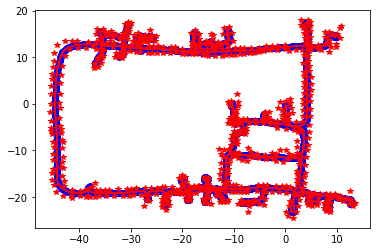

|dX| for step 97 : 1.147115224511913

linearize and build system


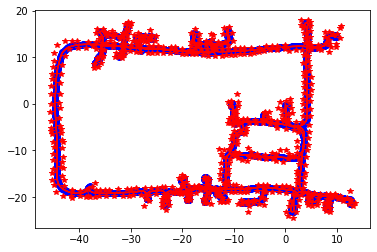

|dX| for step 98 : 1.3428420410134612

linearize and build system


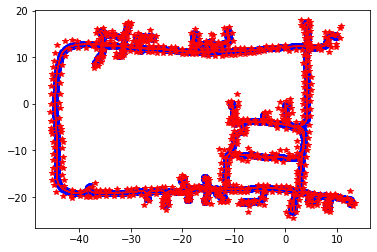

|dX| for step 99 : 1.9902121481424613



In [8]:
filename = 'dlr.g2o'
g = ex5.read_graph_g2o(filename)
err_dlr = ex5.run_graph_slam(g, 100)

Loaded graph with 1728 nodes and 4830 edges
linearize and build system


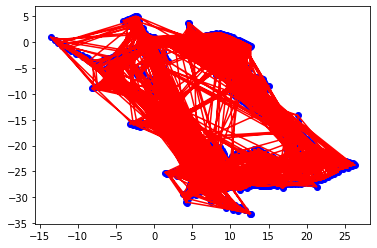

|dX| for step 0 : 424.37850696971924

linearize and build system


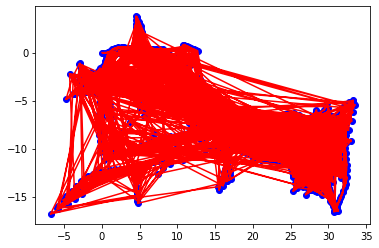

|dX| for step 1 : 681.2918249517522

linearize and build system


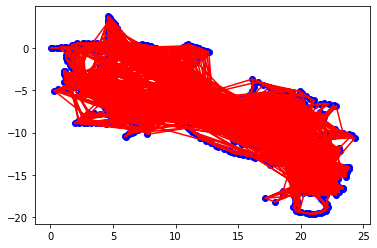

|dX| for step 2 : 290.44983998348823

linearize and build system


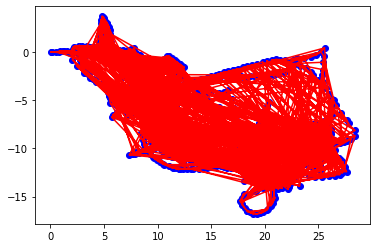

|dX| for step 3 : 200.16928085954686

linearize and build system


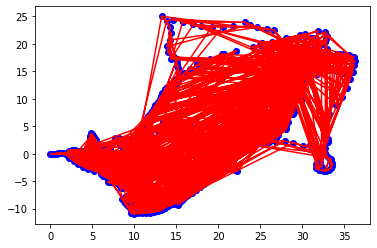

|dX| for step 4 : 674.3833899380878

linearize and build system


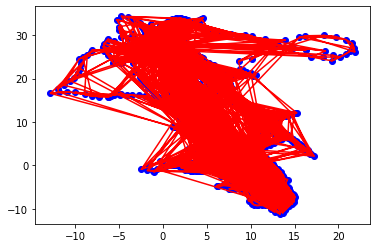

|dX| for step 5 : 842.8637806019243

linearize and build system


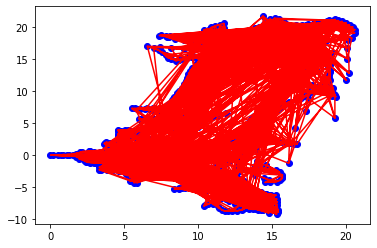

|dX| for step 6 : 499.66283313087575

linearize and build system


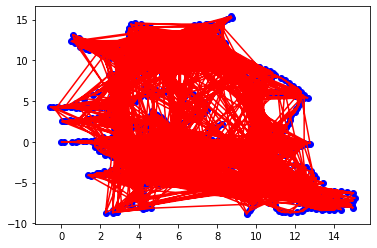

|dX| for step 7 : 298.94180481777704

linearize and build system


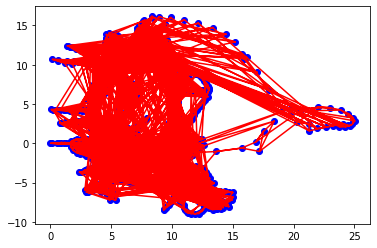

|dX| for step 8 : 112.49332043079774

linearize and build system


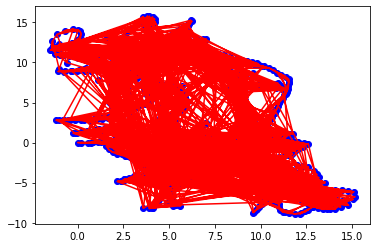

|dX| for step 9 : 149.471858079669

linearize and build system


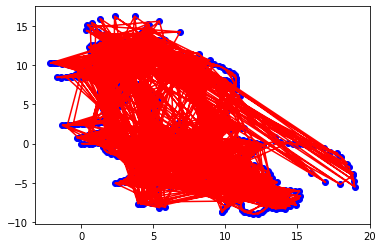

|dX| for step 10 : 121.16718337434617

linearize and build system


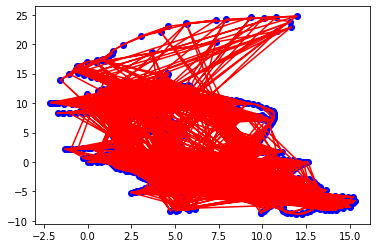

|dX| for step 11 : 137.50488462703285

linearize and build system


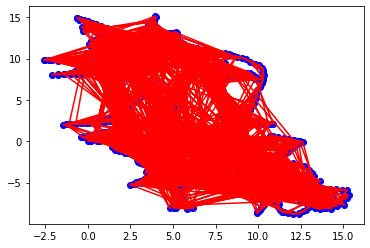

|dX| for step 12 : 104.27374755211656

linearize and build system


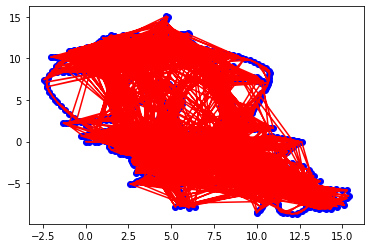

|dX| for step 13 : 48.11976466128725

linearize and build system


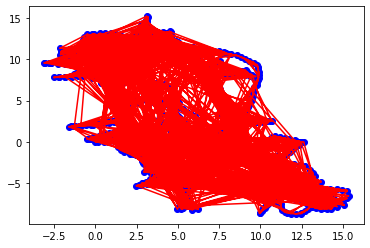

|dX| for step 14 : 42.02321532584608

linearize and build system


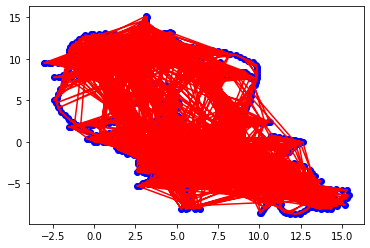

|dX| for step 15 : 28.01611511258097

linearize and build system


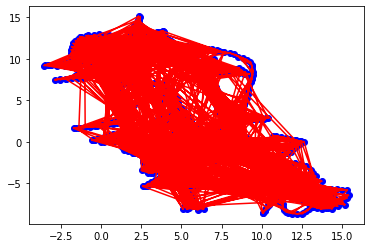

|dX| for step 16 : 30.916101590368832

linearize and build system


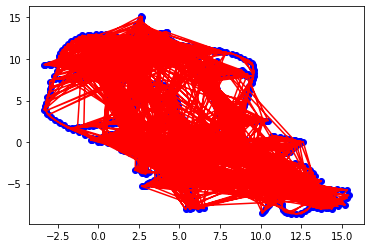

|dX| for step 17 : 32.19928233847861

linearize and build system


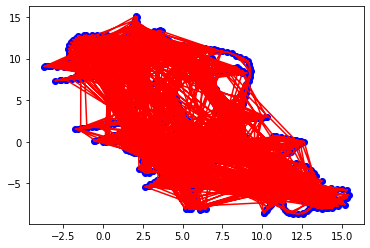

|dX| for step 18 : 33.10682328371019

linearize and build system


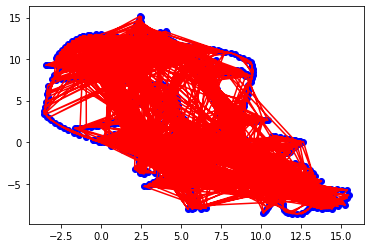

|dX| for step 19 : 33.67781484385932

linearize and build system


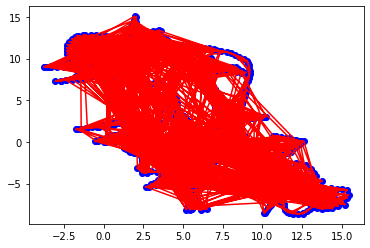

|dX| for step 20 : 33.935027508477326

linearize and build system


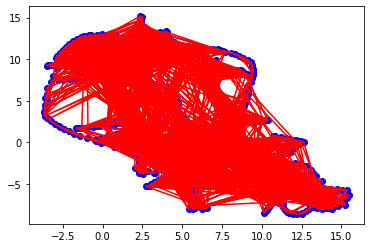

|dX| for step 21 : 34.510083637720314

linearize and build system


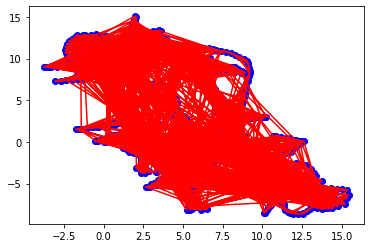

|dX| for step 22 : 34.541037329865276

linearize and build system


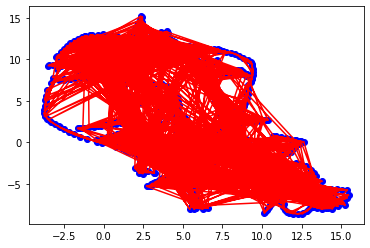

|dX| for step 23 : 34.98931142126053

linearize and build system


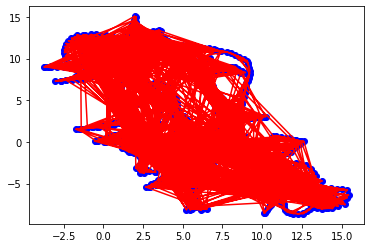

|dX| for step 24 : 34.955528385098965

linearize and build system


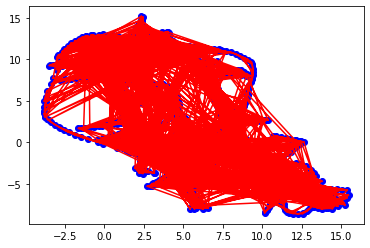

|dX| for step 25 : 35.281088062083676

linearize and build system


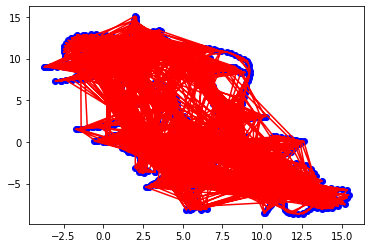

|dX| for step 26 : 35.235252201962666

linearize and build system


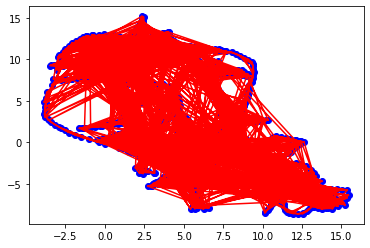

|dX| for step 27 : 35.468863341755394

linearize and build system


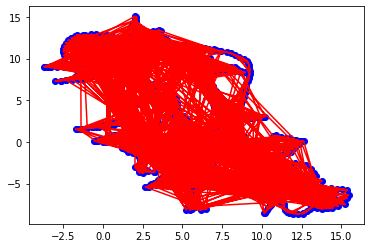

|dX| for step 28 : 35.428649273358154

linearize and build system


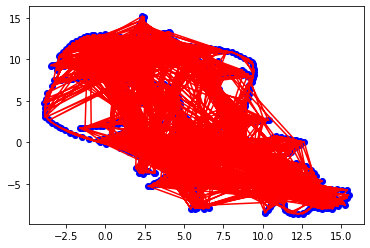

|dX| for step 29 : 35.60231931754646

linearize and build system


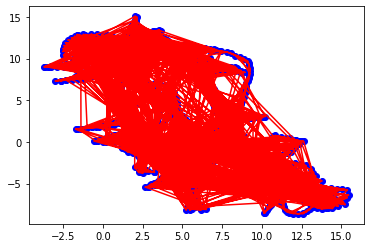

|dX| for step 30 : 35.575375573636016

linearize and build system


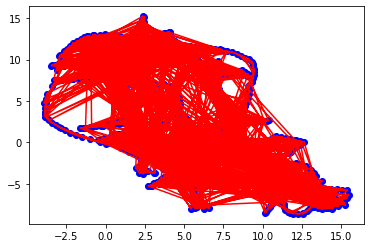

|dX| for step 31 : 35.71619794351315

linearize and build system


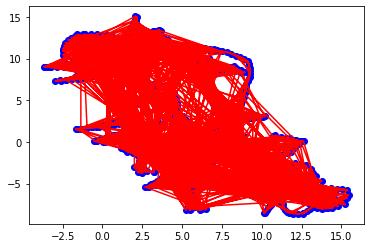

|dX| for step 32 : 35.70706926670356

linearize and build system


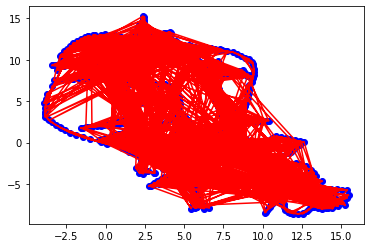

|dX| for step 33 : 35.838021109668844

linearize and build system


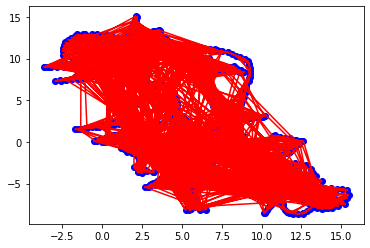

|dX| for step 34 : 35.84984428307343

linearize and build system


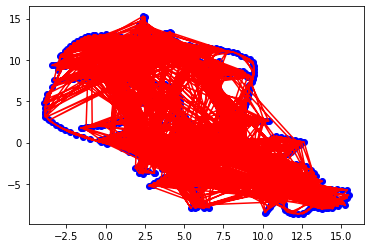

|dX| for step 35 : 35.992149315058384

linearize and build system


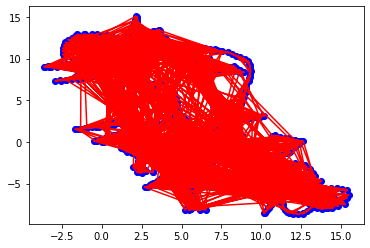

|dX| for step 36 : 36.02740104490502

linearize and build system


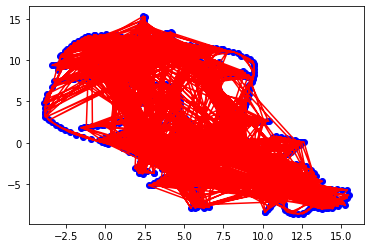

|dX| for step 37 : 36.20407306369259

linearize and build system


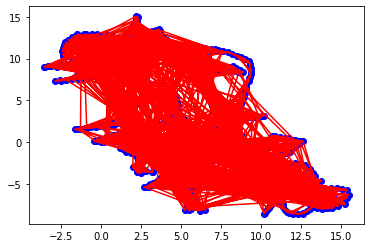

|dX| for step 38 : 36.2648748756719

linearize and build system


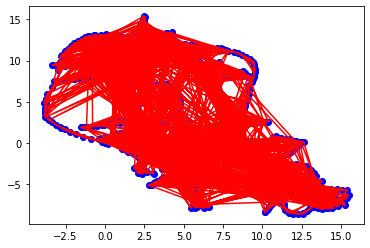

|dX| for step 39 : 36.50443653236724

linearize and build system


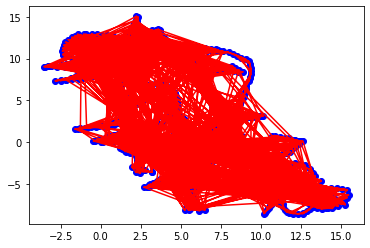

|dX| for step 40 : 36.592403423232994

linearize and build system


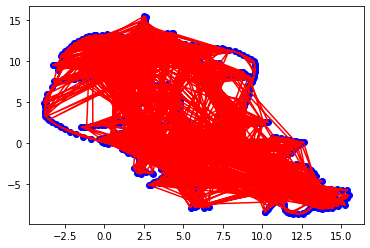

|dX| for step 41 : 36.93180354994445

linearize and build system


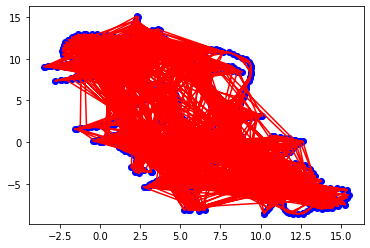

|dX| for step 42 : 37.04775939434654

linearize and build system


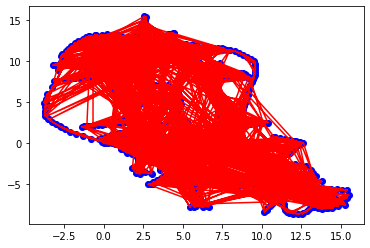

|dX| for step 43 : 37.529948756292974

linearize and build system


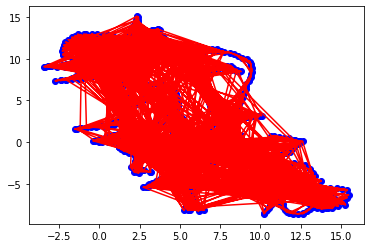

|dX| for step 44 : 37.67451037807528

linearize and build system


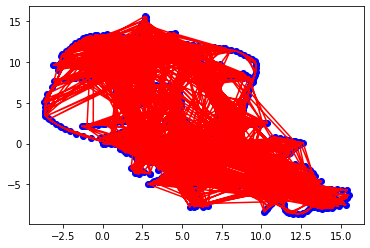

|dX| for step 45 : 38.33355732136893

linearize and build system


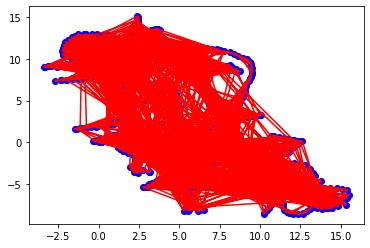

|dX| for step 46 : 38.50918064548048

linearize and build system


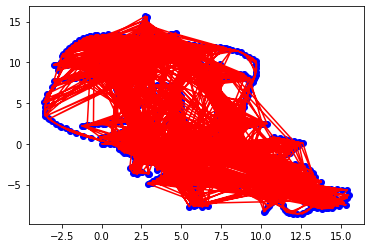

|dX| for step 47 : 39.34017526666296

linearize and build system


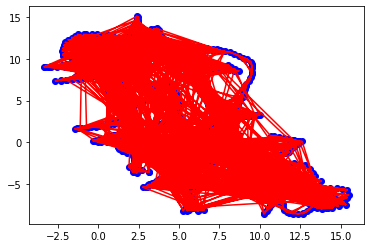

|dX| for step 48 : 39.55251978513473

linearize and build system


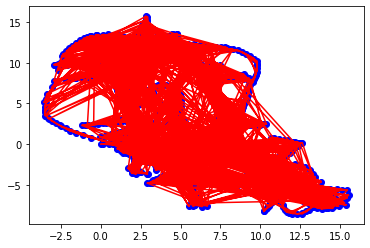

|dX| for step 49 : 40.48542279651912

linearize and build system


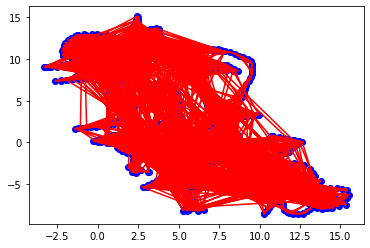

|dX| for step 50 : 40.73800739519431

linearize and build system


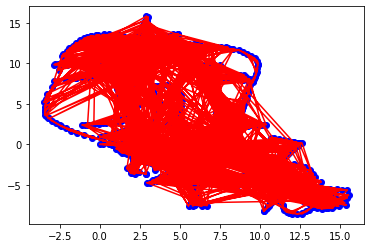

|dX| for step 51 : 41.65289458922902

linearize and build system


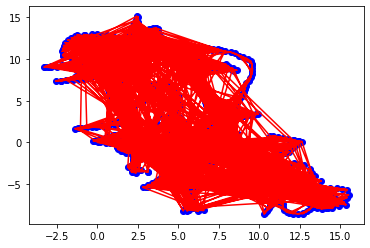

|dX| for step 52 : 41.937114880764476

linearize and build system


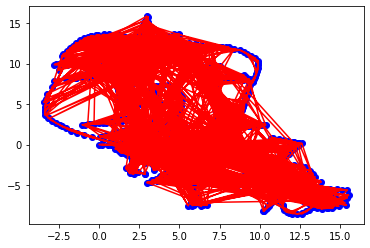

|dX| for step 53 : 42.72426368733616

linearize and build system


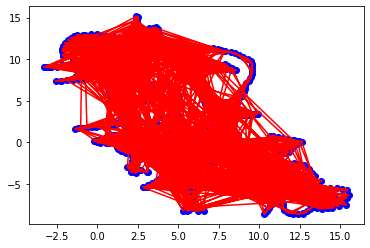

|dX| for step 54 : 43.017146027800244

linearize and build system


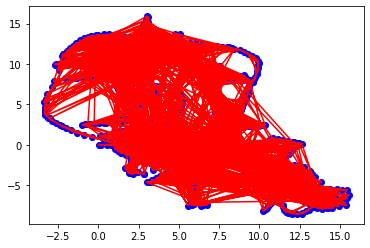

|dX| for step 55 : 43.62557869709688

linearize and build system


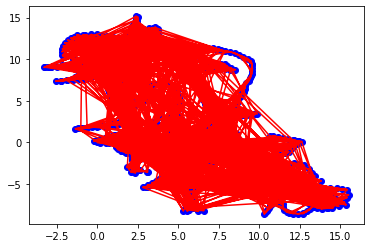

|dX| for step 56 : 43.900425427380796

linearize and build system


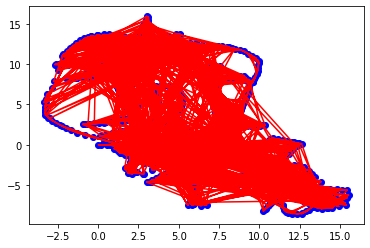

|dX| for step 57 : 44.33753522589736

linearize and build system


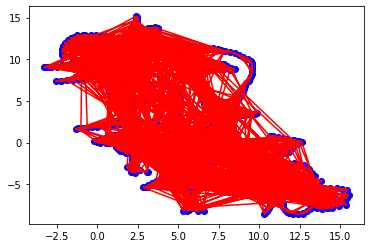

|dX| for step 58 : 44.576100944327756

linearize and build system


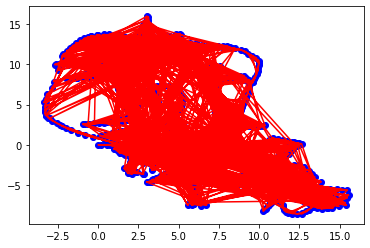

|dX| for step 59 : 44.87796555117796

linearize and build system


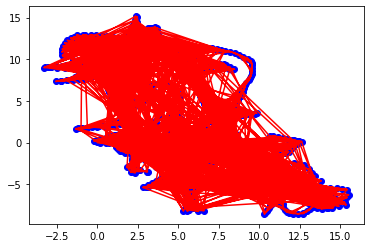

|dX| for step 60 : 45.073949931573

linearize and build system


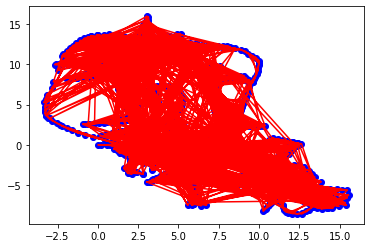

|dX| for step 61 : 45.28000459909538

linearize and build system


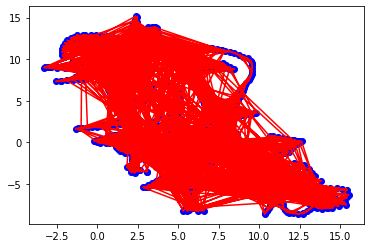

|dX| for step 62 : 45.43545796065126

linearize and build system


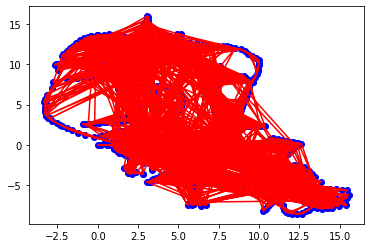

|dX| for step 63 : 45.57730354720081

linearize and build system


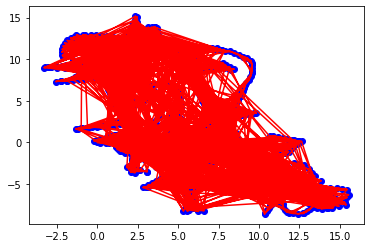

|dX| for step 64 : 45.698291071311

linearize and build system


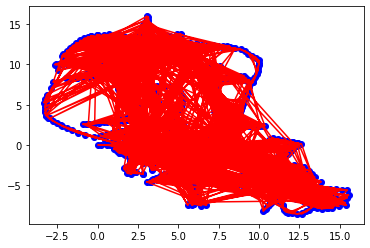

|dX| for step 65 : 45.79784373404329

linearize and build system


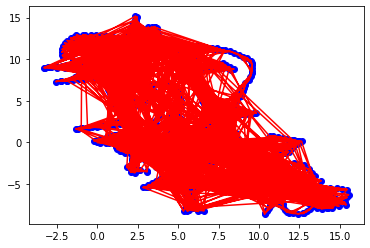

|dX| for step 66 : 45.89125190224654

linearize and build system


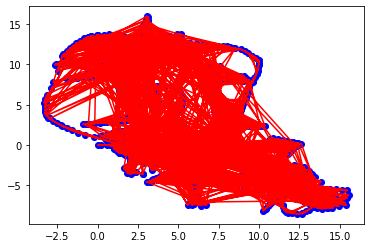

|dX| for step 67 : 45.96280119532028

linearize and build system


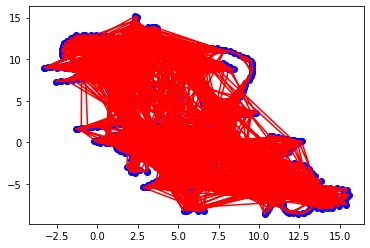

|dX| for step 68 : 46.03475731467622

linearize and build system


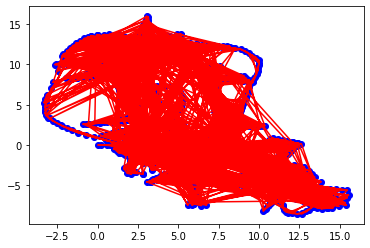

|dX| for step 69 : 46.0874681299071

linearize and build system


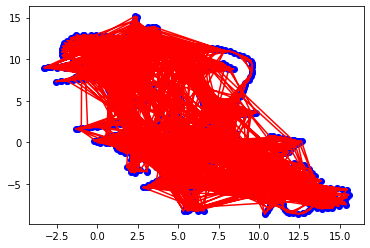

|dX| for step 70 : 46.14291665252641

linearize and build system


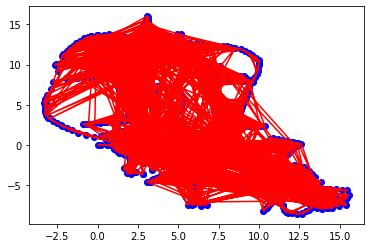

|dX| for step 71 : 46.182596941149995

linearize and build system


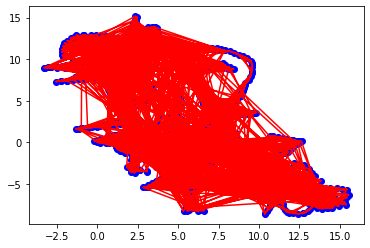

|dX| for step 72 : 46.22549570774791

linearize and build system


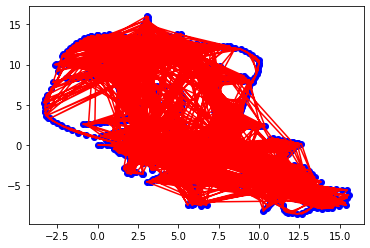

|dX| for step 73 : 46.25588849207481

linearize and build system


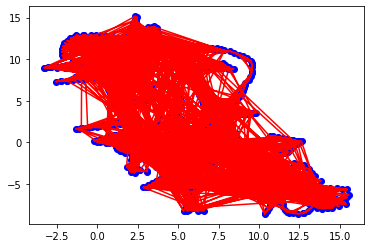

|dX| for step 74 : 46.289115679324716

linearize and build system


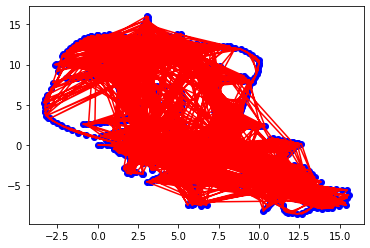

|dX| for step 75 : 46.31274331818054

linearize and build system


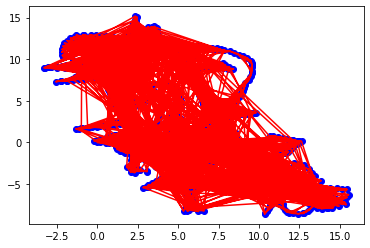

|dX| for step 76 : 46.338545694065715

linearize and build system


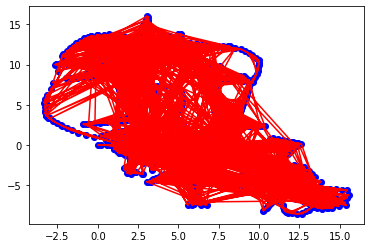

|dX| for step 77 : 46.35706736817271

linearize and build system


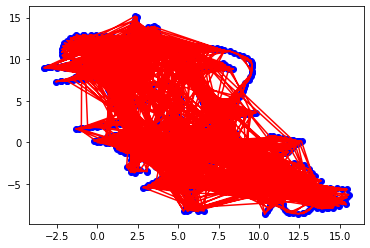

|dX| for step 78 : 46.377180287634005

linearize and build system


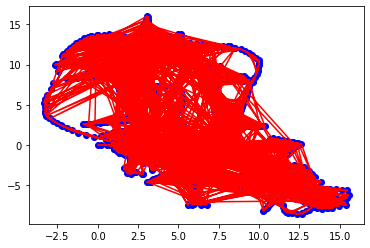

|dX| for step 79 : 46.391856463953324

linearize and build system


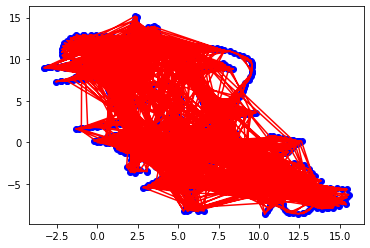

|dX| for step 80 : 46.40756362737189

linearize and build system


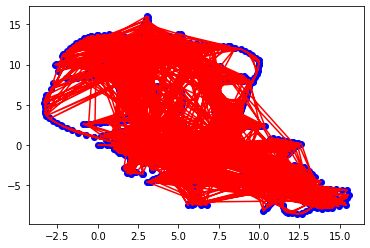

|dX| for step 81 : 46.419239443847346

linearize and build system


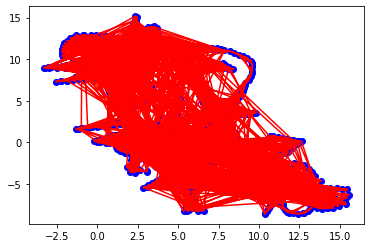

|dX| for step 82 : 46.43148818852431

linearize and build system


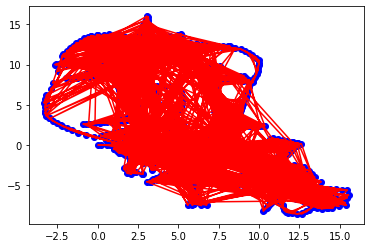

|dX| for step 83 : 46.44089185513713

linearize and build system


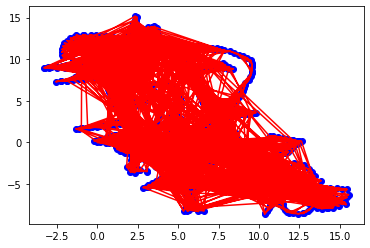

|dX| for step 84 : 46.45045602102342

linearize and build system


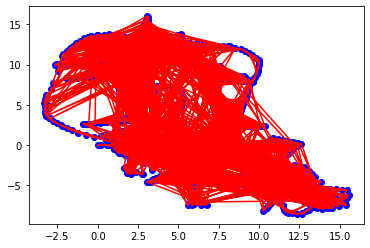

|dX| for step 85 : 46.45804162170403

linearize and build system


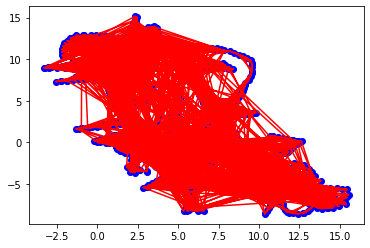

|dX| for step 86 : 46.46558713822678

linearize and build system


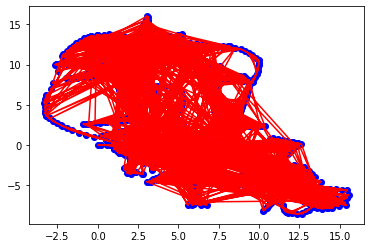

|dX| for step 87 : 46.471690554121906

linearize and build system


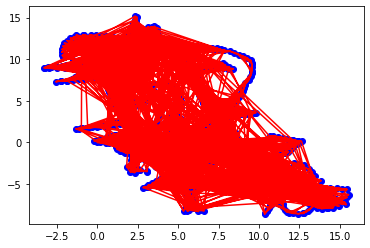

|dX| for step 88 : 46.47758128239564

linearize and build system


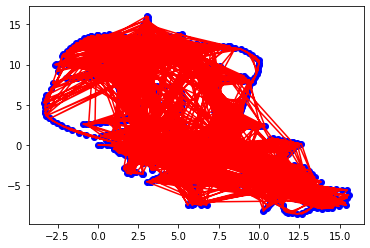

|dX| for step 89 : 46.48249060435479

linearize and build system


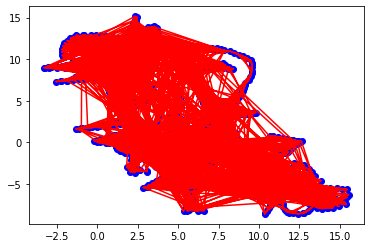

|dX| for step 90 : 46.48713418717511

linearize and build system


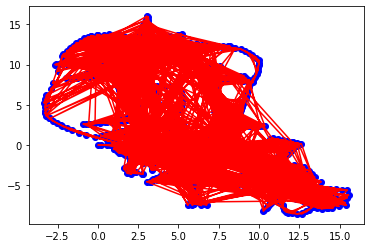

|dX| for step 91 : 46.49118035233422

linearize and build system


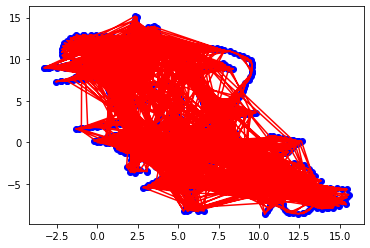

|dX| for step 92 : 46.49479255325956

linearize and build system


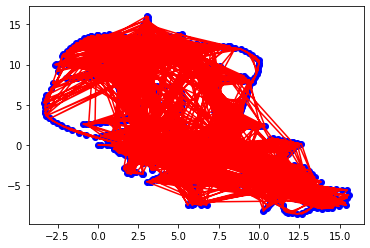

|dX| for step 93 : 46.49808636331095

linearize and build system


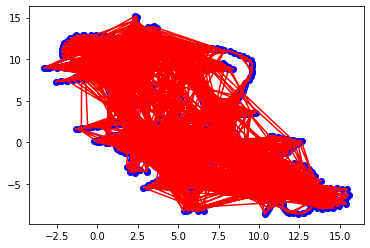

|dX| for step 94 : 46.500886639838264

linearize and build system


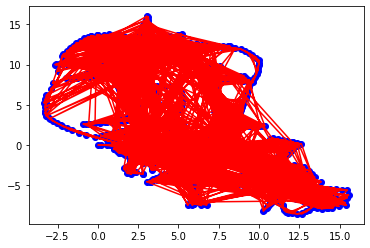

|dX| for step 95 : 46.503607504803405

linearize and build system


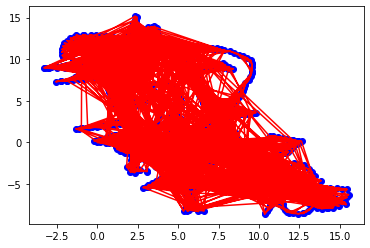

|dX| for step 96 : 46.50587521129965

linearize and build system


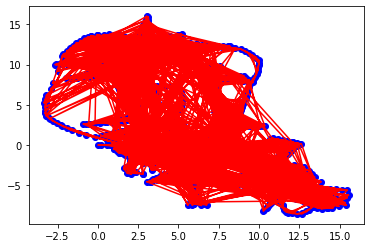

|dX| for step 97 : 46.50803062219058

linearize and build system


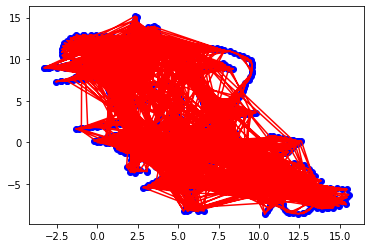

|dX| for step 98 : 46.509734071602374

linearize and build system


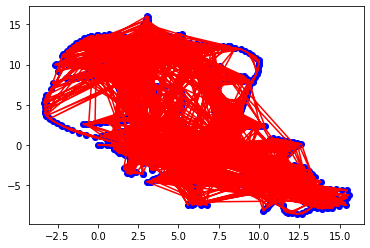

|dX| for step 99 : 46.51152566808209



In [9]:
filename = 'intel.g2o'
g = ex5.read_graph_g2o(filename)
err_i = ex5.run_graph_slam(g, 100)

## 1.2.6 Results for different datasets [5]

Evaluate the results of the graph-slam algorithm for all the four datasets. 

1. Create a `gif` animation visualing the results after each iteration. 
2. Plot the error vs iterations for all the datasets.

Please run your code locally and upload the `gifs` generated from your results in the cell below.

### Simulated Datasets

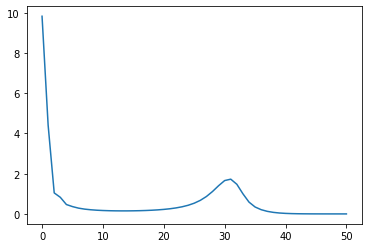

In [11]:
plt.plot(err_pl)

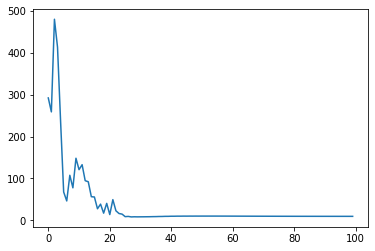

In [12]:
plt.plot(err_pp)

### Real Datasets

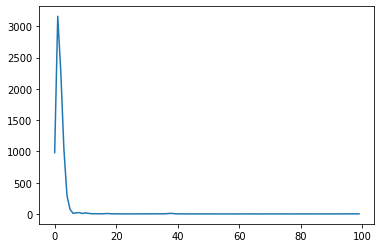

In [13]:
plt.plot(err_dlr)

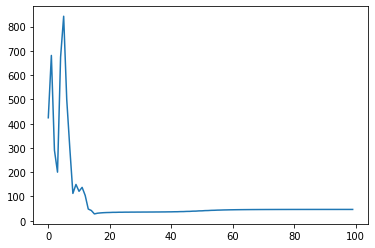

In [14]:
plt.plot(err_i)